In [1]:
# Compares contents of multiple models
import cobra
import pandas as pd, networkx as nx
from collections import OrderedDict
from copy import deepcopy
import os,sys,json
model_root_path = '../../'
sys.path.append(model_root_path)
from pycore.gsm_custom_functions import *
from pycore.cobrapy_custom_extras import *

In [2]:
# Load models (iRhtoC.json, iRhtoBatch-Rabinowitz.json)
model_path = model_root_path+'build_model/input/'

# comparing release2 of iRhtoC with yeast7.6 (which it used as a template)
model1 = load_cobra_model(model_path+'release1-iRhtoC.json')
# model1 = load_cobra_model(model_path+'release2-iRhtoC.json')
model2 = load_cobra_model(model_path+'precursors/yeast_7.6_cobra.xml')

# model1 = cobra.io.load_json_model(model_path+'iRhtoC.json')
# # model1 = cobra.io.load_json_model(model_path+'iRhtoBatch-Rabinowitz_sorted.json')
# model2 = cobra.io.load_json_model(model_path+'iRhtoBatch-Rabinowitz.json')
# see what keys differ
model1_dict = model1.__dict__
model2_dict = model2.__dict__

Model does not contain SBML fbc package information.
SBML package 'layout' not supported by cobrapy, information is not parsed
SBML package 'render' not supported by cobrapy, information is not parsed
Use of CHARGE in the notes element is discouraged, use fbc:charge instead: <Species s_0001 "(1->3)-beta-D-glucan [cell envelope]">
Use of FORMULA in the notes element is discouraged, use fbc:chemicalFormula instead: <Species s_0001 "(1->3)-beta-D-glucan [cell envelope]">
Use of CHARGE in the notes element is discouraged, use fbc:charge instead: <Species s_0002 "(1->3)-beta-D-glucan [cytoplasm]">
Use of FORMULA in the notes element is discouraged, use fbc:chemicalFormula instead: <Species s_0002 "(1->3)-beta-D-glucan [cytoplasm]">
Use of CHARGE in the notes element is discouraged, use fbc:charge instead: <Species s_0003 "(1->3)-beta-D-glucan [extracellular]">
Use of FORMULA in the notes element is discouraged, use fbc:chemicalFormula instead: <Species s_0003 "(1->3)-beta-D-glucan [extracel

In [3]:
# save model2 with metabolites, reactions, and genes sorted
model2_dict['metabolites'].sort()
model2_dict['reactions'].sort()
model2_dict['genes'].sort()
if model_path+model2.id+'.json' not in os.listdir(model_path):
	cobra.io.save_json_model(model2, model_path+model2.id+'.json')

# comparing metabolites, reactions, and genes

In [4]:
synonyms = {'c':{}, 'm':{}, 'r':{}, 'g':{}}
model2_in_model1_format = cobra.Model(model2.id) # model2 using the same IDs as model1

In [5]:
# compare compartments
for comp,name in model1.compartments.items():
	if comp not in model2.compartments:
		for comp2,name2 in model2.compartments.items():
			if name == name2:
				synonyms['c'][comp] = comp2
				model2_in_model1_format.compartments[comp] = name
				print(f'found {comp} in model2 as {name2}')
				break
		if comp not in synonyms['c']:
			synonyms['c'][comp] = None
			print(f'not found in model2: {comp}')
			continue
	else:
		if model1.compartments[comp] != model2.compartments[comp]:
			print(f'compartment {comp} differs: {model1.compartments[comp]} vs {model2.compartments[comp]}')
		else:
			synonyms['c'][comp] = comp

found en in model2 as cell envelope
found c in model2 as cytoplasm
found e in model2 as extracellular
found m in model2 as mitochondrion
found n in model2 as nucleus
found x in model2 as peroxisome
found r in model2 as endoplasmic reticulum
found g in model2 as Golgi
found l in model2 as lipid particle
found v in model2 as vacuole
found rm in model2 as endoplasmic reticulum membrane
found vm in model2 as vacuolar membrane
found gm in model2 as Golgi membrane
found mm in model2 as mitochondrial membrane


In [6]:
# print all different types of attributes in metabolites for model1 and model2
print(f"{model1.id} metabolite attributes: {sorted(list(dict.fromkeys([attr for met in model1.metabolites for attr in list(met.__dict__.keys()) + list(met.annotation.keys()) + list(met.notes.keys())])))}")
print(f"{model2.id} metabolite attributes: {sorted(list(dict.fromkeys([attr for met in model2.metabolites for attr in list(met.__dict__.keys()) + list(met.annotation.keys()) + list(met.notes.keys())])))}")

iRhto1108C metabolite attributes: ['_annotation', '_bound', '_id', '_model', '_reaction', 'biocyc', 'charge', 'chebi', 'chebi.compound', 'compartment', 'formula', 'formula_charge_source', 'kegg.compound', 'kegg.glycan', 'name', 'notes', 'pubchem.compound', 'sbo', 'seed.compound', 'yeastgem76.compound', 'yeastkegg_id', 'ymdb']
ymn metabolite attributes: ['CARBONS', 'CHARGE', 'FORMULA', '_annotation', '_bound', '_id', '_model', '_reaction', 'charge', 'chebi', 'compartment', 'formula', 'kegg.compound', 'kegg.genes', 'kegg.glycan', 'name', 'notes', 'sbo', 'sgd', 'uniprot']


In [7]:
# compare the metabolites
mets_to_consider = [[],[met for met in model1.metabolites],[met for met in model2.metabolites]]
diff_types = set()
for met in model1.metabolites:
	match_found = None
	for met2 in mets_to_consider[2].copy():
		if met.id == met2.id \
		or (model2.id == 'ymn' and met2.id == met.notes.get('yeastgem76.compound') and met.notes.get('yeastgem76.compound') not in ['',None]) \
		or (met2.compartment == synonyms['c'][met.compartment] \
			and ( 
				(met.annotation.get('chebi') not in [None,'','CHEBI:'] and met.annotation.get('chebi') == met2.annotation.get('chebi')) \
				or (met.annotation.get('kegg.compound') not in [None,''] and met.annotation.get('kegg.compound') == met2.annotation.get('kegg.compound')) \
			) \
		):
			# exact matches
			match_found = 'exact'
			model2_in_model1_format.add_metabolites([met])
			mets_to_consider[2].remove(met2) # remove from list of metabolites to consider
		elif met2.compartment == synonyms['c'][met.compartment] and met.charge == met2.charge \
			and (met.formula == met2.formula or sorted(compile_elements_from_formula(met.formula).items()) == sorted(compile_elements_from_formula(met2.formula).items())):
			# formulas are sometimes written differently (e.g., formula for 13BDglucan_en is (C6H10O5)n in yeast7.6 but C6H10O5 in iRhto1108, or H2O vs H2O1)
			match_found = True
		if match_found:
			synonyms['m'][met.id] = met2.id
			if met.id != met2.id:
				print(f'found synonym for {met.id} in model2: {met2.id}')
			for key in model1.metabolites.get_by_id(met.id).__dict__:
				# skip keys that I've either already verified are synonyms or that are not relevant
				if key not in ['_model','_reaction','_id','compartment','name'] and met.__dict__[key] != met2.__dict__[key]:
					diff_types.add(key)
					print('key:',key)
					print(f"\t{model1.id} ({met.id}): {met.__dict__[key]}")
					print(f"\t{model2.id} ({met2.id}): {met2.__dict__[key]}")
			if match_found == 'exact':
				break
	else:
		print(f'not found in model2: {met.id} ({met.formula})')
		synonyms['m'][met.id] = None
print('diff types:',diff_types)

found synonym for 13BDglucan_en in model2: s_0001
key: notes
	iRhto1108C (13BDglucan_en): {'formula_charge_source': 'manual', 'yeastgem76.compound': 's_0001', 'yeastkegg_id': 'C00965[c_02]'}
	ymn (s_0001): {'FORMULA': '(C6H10O5)n', 'CHARGE': '0', 'CARBONS': '6'}
key: _annotation
	iRhto1108C (13BDglucan_en): {'chebi': 'CHEBI:37671', 'kegg.compound': 'C00965', 'pubchem.compound': '64689', 'sbo': 'SBO:0000247', 'seed.compound': 'cpd11791'}
	ymn (s_0001): {'sbo': 'SBO:0000247', 'chebi': 'CHEBI:37671', 'kegg.compound': 'C00965'}
key: formula
	iRhto1108C (13BDglucan_en): C6H10O5
	ymn (s_0001): (C6H10O5)n
found synonym for 13BDglucan_c in model2: s_0002
key: notes
	iRhto1108C (13BDglucan_c): {'formula_charge_source': 'manual', 'yeastgem76.compound': 's_0002', 'yeastkegg_id': 'C00965[c_03]'}
	ymn (s_0002): {'FORMULA': '(C6H10O5)n', 'CHARGE': '0', 'CARBONS': '6'}
key: _annotation
	iRhto1108C (13BDglucan_c): {'chebi': 'CHEBI:37671', 'kegg.compound': 'C00965', 'pubchem.compound': '64689', 'sbo': 

In [8]:
# find how many metabolites have synonyms
print('fraction of metabolites in model2 with synonyms in model1:')
met_synonyms = [m for m in model1.metabolites if synonyms['m'][m.id] != None]
print(len(met_synonyms), '/', len(model2.metabolites), '=', len(met_synonyms)/len(model2.metabolites))
# metabolites in model2 that don't have compartments
met_synonyms2 = [m for m in model2.metabolites if m.compartment not in model2.compartments]
print('fraction of metabolites in model2 that do not have compartments:', len(met_synonyms2), '/', len(model2.metabolites), '=', len(met_synonyms2)/len(model2.metabolites))
# metabolites in model2 that don't have formulas
met_synonyms3 = [m for m in model2.metabolites if m.formula == None]
print('fraction of metabolites in model2 that do not have formulas:', len(met_synonyms3), '/', len(model2.metabolites), '=', len(met_synonyms3)/len(model2.metabolites))
# fraction w/o CHEBI IDs
met_synonyms4 = [m for m in model2.metabolites if m.annotation.get('chebi') == None]
print('fraction of metabolites in model2 that do not have CHEBI IDs:', len(met_synonyms4), '/', len(model2.metabolites), '=', len(met_synonyms4)/len(model2.metabolites))
# metabolites in model2 that have multiple synonyms in model1
met_synonyms5 = [m for m in model2.metabolites if len([met for met in model1.metabolites if m.id == synonyms['m'][met.id]]) > 1]
print('fraction of metabolites in model2 that have multiple synonyms in model1:', len(met_synonyms5), '/', len(model2.metabolites), '=', len(met_synonyms5)/len(model2.metabolites))

fraction of metabolites in model2 with synonyms in model1:
1335 / 3370 = 0.3961424332344214
fraction of metabolites in model2 that do not have compartments: 0 / 3370 = 0.0
fraction of metabolites in model2 that do not have formulas: 1811 / 3370 = 0.5373887240356083
fraction of metabolites in model2 that do not have CHEBI IDs: 1762 / 3370 = 0.5228486646884273
fraction of metabolites in model2 that have multiple synonyms in model1: 0 / 3370 = 0.0


In [9]:
for met2 in met_synonyms5:
	print(f"{met2.id} ({[comp for comp in synonyms['c'].keys() if synonyms['c'][comp] == met2.compartment]})")
	for met in model1.metabolites:
		if met2.id == synonyms['m'][met.id]:
			if model2.id == 'ymn':
				if met2.id == met.notes.get('yeastgem76.compound') and met.notes.get('yeastgem76.compound') not in ['',None]:
					print(f"\t{met.id} ({met.compartment}) - yeastgem76.compound synonym")
				else:
					# remove the synonym
					print(f"\t{met.id} ({met.compartment})")
				# 	synonyms['m'][met.id] = None
			else:
				print(f"\t{met.id} ({met.compartment})")
if len(met_synonyms5) == 0:
	# add all metabolites with synonyms (if they are not already in model2_in_model1_format)
	for met in model1.metabolites:
		if synonyms['m'][met.id] != None:
			if met.id not in model2_in_model1_format.metabolites:
				model2_in_model1_format.add_metabolites([met])
				print(f"added {met.id} as synonym for {synonyms['m'][met.id]}")

In [10]:
# print all different types of attributes in rxns for model1 and model2
print(f"{model1.id} reaction attributes: {sorted(list(dict.fromkeys([attr for i in model1.reactions for attr in list(i.__dict__.keys()) + list(i.annotation.keys()) + list(i.notes.keys())])))}")
print(f"{model2.id} reaction attributes: {sorted(list(dict.fromkeys([attr for i in model2.reactions for attr in list(i.__dict__.keys()) + list(i.annotation.keys()) + list(i.notes.keys())])))}")

iRhto1108C reaction attributes: ['_annotation', '_genes', '_gpr', '_id', '_lower_bound', '_metabolites', '_model', '_upper_bound', 'ec-code', 'kbrxn_id', 'kbrxn_idx', 'kegg.reaction', 'manually_curated', 'name', 'notes', 'sbo', 'seed.reaction', 'subsystem', 'yeastgem76.reaction', 'yeastkegg_id']
ymn reaction attributes: ['GENE_ASSOCIATION', '_annotation', '_genes', '_gpr', '_id', '_lower_bound', '_metabolites', '_model', '_upper_bound', 'kegg.reaction', 'name', 'notes', 'pubmed', 'sbo', 'subsystem']


In [11]:
# compare rxns
rxns_to_consider = [[],[rxn for rxn in model1.reactions],[rxn for rxn in model2.reactions]]
diff_types = set()

for rxn in model1.reactions:
	match_found = None
	for rxn2 in rxns_to_consider[2].copy():
		if rxn.id == rxn2.id or (model2.id == 'ymn' and rxn2.id == rxn.notes.get('yeastgem76.reaction') and rxn.notes.get('yeastgem76.reaction') not in ['',None]):
			# exact matches
			match_found = 'exact'
			model2_in_model1_format.add_reactions([rxn])
			rxns_to_consider[2].remove(rxn2) # remove from list of reactions to consider
		elif sorted(rxn.compartments) == sorted([key for key in synonyms['c'].keys() if synonyms['c'][key] in rxn2.compartments]) and \
		(rxn.annotation.get('kegg.reaction') not in [None,''] and rxn.annotation.get('kegg.reaction') == rxn2.annotation.get('kegg.reaction')):
		# elif rxn.name == rxn2.name and \
		# 	(rxn.annotation.get('ec-code') not in [None,''] and rxn.annotation.get('ec-code') == rxn2.annotation.get('ec-code')) \
		# 	and (rxn.gene_reaction_rule == rxn2.gene_reaction_rule or sorted(rxn.gene_reaction_rule.split(' or ')) == sorted(rxn2.gene_reaction_rule.split(' or '))) \
		# 	and (rxn.subsystem == rxn2.subsystem or (rxn.subsystem is None and rxn2.subsystem in [None,'']) or (rxn.subsystem in [None,''] and rxn2.subsystem is None)):
			# names, EC codes, gene rules, and subsystems match
			match_found = True
			print(f'found {rxn.id} in model2 with different id: {rxn2.id} ({rxn2.name})')
		if match_found:
			synonyms['r'][rxn.id] = rxn2.id
			if rxn.id != rxn2.id:
				print(f'found synonym for {rxn.id} in model2: {rxn2.id}')
			for key in model1.reactions.get_by_id(rxn.id).__dict__:
				# skip keys that I've either already verified are synonyms or that are not relevant
				if key not in ['_model','_metabolites','_id','name','subsystem'] and rxn.__dict__[key] != rxn2.__dict__[key]:
					diff_types.add(key)
					print('key:',key)
					print(f"\t{model1.id} ({rxn.id}): {rxn.__dict__[key]}")
					print(f"\t{model2.id} ({rxn2.id}): {rxn2.__dict__[key]}")
			if match_found == 'exact':
				break
	else:
		print(f'not found in model2: {rxn.id}')
		synonyms['r'][rxn.id] = None
print('diff types:',diff_types)

found synonym for RLFC2O_c in model2: r_0001
key: notes
	iRhto1108C (RLFC2O_c): {'yeastgem76.reaction': 'r_0001', 'yeastkegg_id': 'r_0001'}
	ymn (r_0001): {'GENE_ASSOCIATION': '((YDL174C AND YEL039C) OR (YDL174C AND YJR048W) OR (YEL039C AND YEL071W) OR (YEL071W AND YJR048W))'}
key: _annotation
	iRhto1108C (RLFC2O_c): {'ec-code': '1.1.2.4', 'kegg.reaction': 'R00197', 'sbo': 'SBO:0000176'}
	ymn (r_0001): {'sbo': 'SBO:0000176', 'kegg.reaction': 'R00197'}
key: _gpr
	iRhto1108C (RLFC2O_c): rt4960 and rt0434
	ymn (r_0001): (YDL174C and YEL039C) or (YDL174C and YJR048W) or (YEL039C and YEL071W) or (YEL071W and YJR048W)
key: _genes
	iRhto1108C (RLFC2O_c): {<Gene rt4960 at 0x32abf0190>, <Gene rt0434 at 0x32abf06a0>}
	ymn (r_0001): {<Gene YEL039C at 0x329d73f10>, <Gene YJR048W at 0x32aace130>, <Gene YEL071W at 0x32aace040>, <Gene YDL174C at 0x32aace250>}
key: _upper_bound
	iRhto1108C (RLFC2O_c): 1000.0
	ymn (r_0001): inf
found synonym for RLFC2O_m in model2: r_0002
key: notes
	iRhto1108C (RLFC2O

found synonym for EGHLAT_c in model2: r_0681
key: notes
	iRhto1108C (EGHLAT_c): {'yeastgem76.reaction': 'r_0681', 'yeastkegg_id': 'r_0681'}
	ymn (r_0681): {'GENE_ASSOCIATION': 'YLR027C'}
key: _annotation
	iRhto1108C (EGHLAT_c): {'ec-code': '2.6.1.1', 'sbo': 'SBO:0000176'}
	ymn (r_0681): {'sbo': 'SBO:0000176'}
key: _gpr
	iRhto1108C (EGHLAT_c): rt0568 or rt1784
	ymn (r_0681): YLR027C
key: _genes
	iRhto1108C (EGHLAT_c): {<Gene rt0568 at 0x3231e7d90>, <Gene rt1784 at 0x32213f5e0>}
	ymn (r_0681): {<Gene YLR027C at 0x329f171c0>}
key: _upper_bound
	iRhto1108C (EGHLAT_c): 1000.0
	ymn (r_0681): inf
found synonym for EGHLAT_x in model2: r_0683
key: notes
	iRhto1108C (EGHLAT_x): {'yeastgem76.reaction': 'r_0683', 'yeastkegg_id': 'r_0683'}
	ymn (r_0683): {'GENE_ASSOCIATION': 'YLR027C'}
key: _annotation
	iRhto1108C (EGHLAT_x): {'ec-code': '2.6.1.1', 'sbo': 'SBO:0000176'}
	ymn (r_0683): {'sbo': 'SBO:0000176'}
key: _gpr
	iRhto1108C (EGHLAT_x): rt0568 or rt5562
	ymn (r_0683): YLR027C
key: _genes
	iRhto

In [12]:
# find how many reactions have synonyms
print('fraction of reactions in model2 with synonyms in model1:')
rxn_synonyms = [r for r in model1.reactions if synonyms['r'][r.id] != None]
print(len(rxn_synonyms), '/', len(model2.reactions), '=', len(rxn_synonyms)/len(model2.reactions))
print(len(model1.reactions), 'reactions in model1')
# reactions in model2 with multiple synonyms in model1
rxn_synonyms2 = [r for r in model2.reactions if len([rxn for rxn in model1.reactions if r.id == synonyms['r'][rxn.id]]) > 1]
print('fraction of reactions in model2 that have multiple synonyms in model1:', len(rxn_synonyms2), '/', len(model2.reactions), '=', len(rxn_synonyms2)/len(model2.reactions))

for rxn2 in rxn_synonyms2:
	print(f"{rxn2.id} ({[comp for comp in synonyms['c'].keys() if synonyms['c'][comp] in rxn2.compartments]})")
	for rxn in model1.reactions:
		if rxn2.id == synonyms['r'][rxn.id]:
			if model2.id == 'ymn':
				if rxn2.id == rxn.notes.get('yeastgem76.reaction') and rxn.notes.get('yeastgem76.reaction') not in ['',None]:
					print(f"\t{rxn.id} - yeastgem76.reaction synonym")
				else:
					# remove the synonym
					print(f"\t{rxn.id}")
				# 	synonyms['r'][rxn.id] = None
			else:
				print(f"\t{rxn.id}")
if len(rxn_synonyms2) == 0:
	# add all reactions with synonyms (if they are not already in model2_in_model1_format)
	for rxn in model1.reactions:
		if synonyms['r'][rxn.id] != None:
			if rxn.id not in model2_in_model1_format.reactions:
				model2_in_model1_format.add_reactions([rxn])
				print(f"added {rxn.id} as synonym for {synonyms['r'][rxn.id]}")
			rxn2 = model2.reactions.get_by_id(synonyms['r'][rxn.id])
			# check if .metabolites is identical, when converting all known synonyms to model1 format
			rxn2_metabolites = sorted(
				[(met.id, coeff) for met2, coeff in rxn2.metabolites.items() 
				 for met in model2_in_model1_format.metabolites if met2.id == synonyms['m'][met.id]]
			)
			rxn1_metabolites = sorted([(met.id, coeff) for met, coeff in rxn.metabolites.items()])
			if sorted([(m.id, c) for m, c in rxn.metabolites.items()]) != rxn2_metabolites:
				print(f'different metabolites for {rxn.id} in model2: {rxn2.id}')
				# print only the metabolites that differ
				rxn1_diff = [(m.id,c) for m, c in rxn.metabolites.items() if (m.id, c) not in rxn2_metabolites]
				rxn2_diff = [(m,c) for m, c in rxn2_metabolites if (m, c) not in rxn1_metabolites]
				if len(rxn1_diff) != 0:
					print(f"\t{model1.id} ({rxn.id}): {rxn1_diff}")
				if len(rxn2_diff) != 0:
					print(f"\t{model2.id} ({rxn2.id}): {rxn2_diff}")
				# update the metabolites in model2_in_model1_format
				model2_in_model1_format.reactions.get_by_id(rxn.id).add_metabolites({met: -coeff for met, coeff in rxn.metabolites.items()})
				for met2, coeff in rxn2_metabolites:
					# find the metabolite in model2_in_model1_format
					met = model2_in_model1_format.metabolites.get_by_id(met2)
					model2_in_model1_format.reactions.get_by_id(rxn.id).add_metabolites({met: coeff})
				# print(f"\t{model1.id} ({rxn.id}): {[(m.id, c) for m, c in rxn.metabolites.items()]}")
				# print(f"\t{model2.id} ({rxn2.id}): {rxn2_metabolites}")
				print(f"\t{rxn.id},r,reaction:{model2_in_model1_format.reactions.get_by_id(rxn.id).reaction}")
			# update any other attributes that differ
			for key in rxn2.__dict__:
				if key not in ['_model','_metabolites','_id','name','subsystem'] and rxn.__dict__[key] != rxn2.__dict__[key]:
					print(f"updated {key} for {rxn.id} in model2_in_model1_format from {rxn.__dict__[key]} to {rxn2.__dict__[key]}")
					setattr(model2_in_model1_format.reactions.get_by_id(rxn.id), key, rxn2.__dict__[key])

fraction of reactions in model2 with synonyms in model1:
1514 / 4643 = 0.3260822743915572
2204 reactions in model1
fraction of reactions in model2 that have multiple synonyms in model1: 0 / 4643 = 0.0
different metabolites for RLFC2O_c in model2: r_0001
	iRhto1108C (RLFC2O_c): [('h_c', 2.0)]
	RLFC2O_c,r,reaction:2.0 ficytC_m + lac__D_c --> 2.0 focytC_m + pyr_c
updated notes for RLFC2O_c in model2_in_model1_format from {'yeastgem76.reaction': 'r_0001', 'yeastkegg_id': 'r_0001'} to {'GENE_ASSOCIATION': '((YDL174C AND YEL039C) OR (YDL174C AND YJR048W) OR (YEL039C AND YEL071W) OR (YEL071W AND YJR048W))'}
updated _annotation for RLFC2O_c in model2_in_model1_format from {'ec-code': '1.1.2.4', 'kegg.reaction': 'R00197', 'sbo': 'SBO:0000176'} to {'sbo': 'SBO:0000176', 'kegg.reaction': 'R00197'}
updated _gpr for RLFC2O_c in model2_in_model1_format from rt4960 and rt0434 to (YDL174C and YEL039C) or (YDL174C and YJR048W) or (YEL039C and YEL071W) or (YEL071W and YJR048W)
updated _genes for RLFC2O_

In [13]:
save_cobra_model(model2_in_model1_format, model_path+model2.id+'_formatted_to_'+ model1.id+'.json', sort=True)

# comparing fluxes thru pathways making a product

In [5]:
# using flux data, compare fluxes thru pathways making a given product
# product = 'pmtalc'
# product = 'co2'
# product = 'trnaala'
product = 'tyr__L'
output_path='./yields/'+product+'/'
target_reactants = []
# target_reactants = ['glc__D_e']
# target_reactants = ['sucr_e']
# prod_in_model = product + '_e'
prod_in_model = product + '_c'

model1a = cobra.io.load_json_model(model_root_path+'application/input/iRhtoBatch-Rabinowitz_pathwayadd.json')
model2a = cobra.io.load_json_model(model_root_path+'../scRBA/application/input/GSM_iSace1144_rba_pathwayadd.json')
model = [{'model':model1a,'name':model1a.id},{'model':model2a,'name':model2a.id}]

In [6]:
# find rxns involving the most metabolites
met_count = {}
for m in [model1a,model2a]:
	for rxn in m.reactions:
		met_count[rxn.id] = len(rxn.metabolites)
met_count = OrderedDict(sorted(met_count.items(), key=lambda x: x[1], reverse=True))
print('Most metabolites involved in rxns:')
for rxn in list(met_count.keys())[:10]:
	print(rxn,met_count[rxn])
thresh = 85

Most metabolites involved in rxns:
BiomassKim_e 97
BIOMASS_AERO_SC_hvd 90
BIOMASS_AERO_SC_RBA 90
BIOMASS_STARVEAERO_SC_hvd 90
BIOMASS_BATCHANAERO_SC_hvd 89
BIOMASS_CHEMOANAERO_SC_hvd 89
BIOMASS_STARVEANAERO_SC_hvd 89
BIOMASS 88
BIOMASS_MFA 88
BIOMASS_MFA_NO_GAM 85


In [7]:
# load fluxes from path
flux_path = 'application/output_max_withoutMP/'+product+'/fba_fluxes.csv'
# flux_path = 'application/output_max_withoutMP/'+product+'/flux_with_biomass.escher.csv'
rba_flux_path = 'application/output_max_withoutMP/'+product+'/RBA_result.json'
# model1_fluxes = pd.read_csv(model_root_path+flux_path)
# read excel sheet from flux_path, keeping only 'id' and 'val_fit' columns
model1_fluxes = pd.read_excel('/Users/ejm6426/Documents/rtRBA-main/parameterization/kapp/datasets/raw_data_files/Rabinowitz-flux.xlsx',usecols=['id','val_fit','reaction'])
# change 'id' and 'val_fit' columns to 'rxn' and 'flux' respectively
model1_fluxes.columns = ['rxn','reaction','flux']
model1_fluxes_dict = model1_fluxes.to_dict(orient='records')
# model[0]['v_rba'] = json.load(open(model_root_path+rba_flux_path))
model[0]['v_rba'] = model1_fluxes_dict

# model2_fluxes = pd.read_csv(model_root_path+'../scRBA/'+flux_path)
model2_fluxes = pd.read_excel('/Users/ejm6426/Documents/scRBA/parameterization/kapp/datasets/raw_data_files/SC_MFA_flux_CENPK_batch_Rabinowitz.xlsx',usecols=['id','val_fit','reaction'])
model2_fluxes.columns = ['rxn','reaction','flux']
model2_fluxes_dict = model2_fluxes.to_dict(orient='records')
# model[1]['v_rba'] = json.load(open(model_root_path+'../scRBA/'+rba_flux_path))
model[1]['v_rba'] = model2_fluxes_dict
delim = '...'
v_delim = ' '

In [11]:
# find all cofactors
model[0]['prot'] = read_spreadsheet(model_root_path+'build_model/model/PROTEIN_stoich_curation.tsv')
model[1]['prot'] = read_spreadsheet(model_root_path+'../scRBA/build_model/input/PROTEIN_stoich_curation.xlsx')
# find unique cofactors in each
if False: # disabled only for now
	for m in model:
		m['cofs'] = dict()
		# find unique cofactors in each
		for i in range(len(m['prot'])):
			prot_st = m['prot'].iloc[i]
			cofs_str = prot_st.cofactor_stoich
			if pd.isnull(cofs_str) == False:
				cofs_st = cofs_str.split(',')
				cofs_st = OrderedDict({c.split(':')[0]:c.split(':')[1] for c in cofs_st})
				# find uniprot id in "prot"
				if 'PROSYN-'+prot_st.id in m['v_rba']['raw_flux']:
					for k,v in cofs_st.items():
						v_cof = float(v)*m['v_rba']['raw_flux']['PROSYN-'+prot_st.id]
						if k not in m['cofs']:
							m['cofs'][k] = v_cof
						else:
							m['cofs'][k] += v_cof

In [12]:
try:
	model1_fluxes_dict = model1_fluxes.set_index('Rxn').to_dict()['Flux']
except:
	model1_fluxes_dict = model1_fluxes.set_index('rxn').to_dict()['flux']
# if a rxn is in model1a but not model1_fluxes, add it with a flux of 0
for rxn in model1a.reactions:
	if rxn.id not in model1_fluxes_dict:
		model1_fluxes_dict[rxn.id] = 0
try:
	model2_fluxes_dict = model2_fluxes.set_index('Rxn').to_dict()['Flux']
	# if a rxn is in model2a but not model2_fluxes, add it with a flux of 0
except:
	model2_fluxes_dict = model2_fluxes.set_index('rxn').to_dict()['flux']
	# if a rxn is in model2a but not model2_fluxes, add it with a flux of 0
for rxn in model2a.reactions:
	if rxn.id not in model2_fluxes_dict:
		model2_fluxes_dict[rxn.id] = 0

In [13]:
# find rxns in flux data that aren't in their respective models
model1a_full = deepcopy(model1a)
model2a_full = deepcopy(model2a)

In [14]:
# remove all rxns from models, if the 'reactions' column is present in the flux data and has any non-null values
if 'reaction' in model1_fluxes.columns and model1_fluxes['reaction'].isnull().any() == False:
	# remove all non-exchange rxns from model1a
	# model1a.remove_reactions([r for r in model1a.reactions if r not in model1a.exchanges])
	# model2a.remove_reactions([r for r in model2a.reactions if r not in model2a.exchanges])
	model1a.remove_reactions(model1a.reactions)
	model2a.remove_reactions(model2a.reactions)

In [15]:
model_rxns = []
new_metabolites = set()
for m in model:
	model_rxns.append([r.id for r in m['model'].reactions])
model_rxns = [set(m) for m in model_rxns]
# compare to flux dicts
model1_rxns = set(model1_fluxes_dict.keys())
model1_diff = model1_rxns - model_rxns[0]
print('Model 1 fluxes not in model:')
for r in model1_diff:
	# check if there are matching rows before accessing the first element
	if model1_fluxes[model1_fluxes['rxn'] == r].empty or pd.isnull(model1_fluxes[model1_fluxes['rxn'] == r]['reaction'].values[0]):
		continue
	rxn_str = model1_fluxes[model1_fluxes['rxn'] == r]['reaction'].values[0]
	print(r, ':', rxn_str)
	# add rxn to model
	rxn = cobra.Reaction(r)
	# rxn.name = model1_fluxes[model1_fluxes['rxn'] == r]['reaction'].values[0]
	# print any metabolites that aren't in the model
	# find all metabolites in the reaction (by parsing the reaction string)
	mets = rxn_str.split(' ')
	mets = [m for m in mets if m not in ['+','-->','<=>']]
	# remove mets that are just numbers
	mets = [m for m in mets if not m.replace('.','').replace(',','').isnumeric()]
	# find any metabolites that aren't in the model
	mets_not_in_model = [m for m in mets if m not in model1a.metabolites]
	# print any metabolites that aren't in the model
	if len(mets_not_in_model) > 0:
		# print('Metabolites not in model:',mets_not_in_model)
		new_metabolites.update(mets_not_in_model)
		# add metabolites to model
		for m in mets_not_in_model:
			met = cobra.Metabolite(m)
			model1a.add_metabolites([met])
	model1a.add_reactions([rxn])
	model1a.reactions.get_by_id(r).reaction = rxn_str
# model2
model2_rxns = set(model2_fluxes_dict.keys())
model2_diff = model2_rxns - model_rxns[1]
print('Model 2 fluxes not in model:')
for r in model2_diff:
	# check if there are matching rows before accessing the first element
	if model2_fluxes[model2_fluxes['rxn'] == r].empty or pd.isnull(model2_fluxes[model2_fluxes['rxn'] == r]['reaction'].values[0]):
		continue
	rxn_str = model2_fluxes[model2_fluxes['rxn'] == r]['reaction'].values[0]
	print(r, ':', rxn_str)
	# add rxn to model
	rxn = cobra.Reaction(r)
	# rxn.name = model2_fluxes[model2_fluxes['rxn'] == r]['reaction'].values[0]
	# print any metabolites that aren't in the model
	# find all metabolites in the reaction (by parsing the reaction string)
	mets = rxn_str.split(' ')
	mets = [m for m in mets if m not in ['+','-->','<=>']]
	# remove mets that are just numbers
	mets = [m for m in mets if not m.replace('.','').replace(',','').isnumeric()]
	# find any metabolites that aren't in the model
	mets_not_in_model = [m for m in mets if m not in model2a.metabolites]
	# print any metabolites that aren't in the model
	if len(mets_not_in_model) > 0:
		# print('Metabolites not in model:',mets_not_in_model)
		new_metabolites.update(mets_not_in_model)
		# add metabolites to model
		for m in mets_not_in_model:
			met = cobra.Metabolite(m)
			model2a.add_metabolites([met])
	model2a.add_reactions([rxn])
	model2a.reactions.get_by_id(r).reaction = rxn_str
# save models
cobra.io.save_json_model(model1a,model_root_path+'iRhtoBatch-Rabinowitz_MFA.json')
cobra.io.save_json_model(model2a,model_root_path+'GSM_iSace1144_MFA.json')

Model 1 fluxes not in model:
ALDD2y_c : acald_c + h2o_c + nadp_c --> ac_c + 2.0 h_c + nadph_c
SUCDq9_m : q9_m + succ_m <=> fum_m + q9h2_m
MALt2_m : mal__L_c + pi_m --> mal__L_m + pi_c
SERAT_c : accoa_c + ser__L_c --> acser_c + coa_c
PGMT_c : g6p_c --> g1p_c
ATPM_c : atp_c + h2o_c --> adp_c + h_c + pi_c
ADSL2i_c : 25aics_c --> aicar_c + fum_c
ACONTb_m : acon_C_m + h2o_m --> icit_m
ASPGLUt_c_m : asp__L_m + glu__L_c --> asp__L_c + glu__L_m
MDH_c : mal__L_c + nad_c <=> h_c + nadh_c + oaa_c
ILETA_m : 3mop_m + glu__L_m --> akg_m + ile__L_m
DHORTS_c : cbasp_c + h_c --> dhor__S_c + h2o_c
ASAD_c : 4pasp_c + h_c + nadph_c --> aspsa_c + nadp_c + pi_c
CO2t_c_m : co2_c <=> co2_m
KARA2i_m : 2ahbut_m + h_m + nadph_m --> 23dhmp_m + nadp_m
RNDR2_c : gdp_c + trdrd_c --> dgdp_c + h2o_c + trdox_c
O2t_c_e : o2_e --> o2_c
C4STMO3_c : nadph_c + o2_c + zym_int1B_c --> h2o_c + nadp_c + zym_int1C_c
PKETX_c : pi_c + xu5p__D_c --> actp_c + g3p_c + h2o_c
PMANM_c : man6p_c --> man1p_c
lumpFACOA240_c : accoa_c + atp

No reactants provided as stopping points; using medium metabolites
Node not found: 4abz_e or tyr__L_c
Node not found: cl_e or tyr__L_c
Node not found: cobalt2_e or tyr__L_c
Node not found: inost_e or tyr__L_c
Node not found: na1_e or tyr__L_c
Node not found: pydxn_e or tyr__L_c
Node not found: thm_e or tyr__L_c
Skipping edge labels: draw_networkx_edge_labels does not support multiedges.
Nodes:  317
Edges:  2032


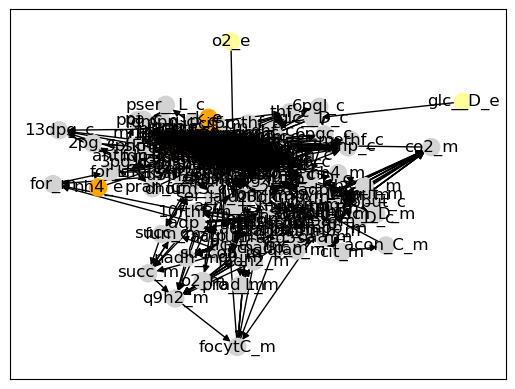

In [16]:
node_font_size=8
edge_font_size=8
exclude_common_mets=False
mg = find_pathways(model1a,[prod_in_model],flux_dict=model1_fluxes_dict,target_reactants=target_reactants,flux_reporting_decimals=4,exclude_common_mets=exclude_common_mets,
				   node_font_size=node_font_size,edge_font_size=edge_font_size,output_path=output_path)
# mg.append(deepcopy(mg[1]))

No reactants provided as stopping points; using medium metabolites
Node not found: cl_e or tyr__L_c
Skipping edge labels: draw_networkx_edge_labels does not support multiedges.
Nodes:  339
Edges:  2334


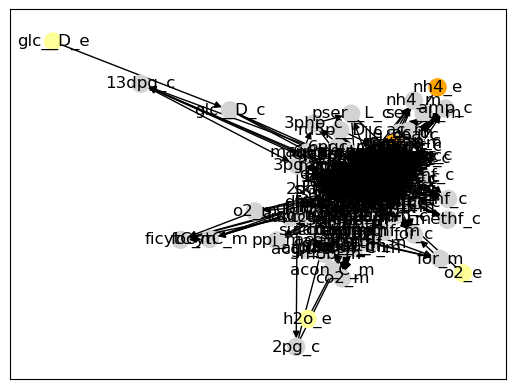

In [17]:
m2g = find_pathways(model2a,[prod_in_model],flux_dict=model2_fluxes_dict,target_reactants=target_reactants,flux_reporting_decimals=4,exclude_common_mets=exclude_common_mets,
					node_font_size=node_font_size,edge_font_size=edge_font_size,output_path=output_path)
# m2g.append(deepcopy(m2g[1]))
ctr = 4

In [18]:
# # compare mg[0] and m2g[0]; remove edges that have the same flux in both
# for edge in mg[0].edges:
# 	# if edge in m2g[0]
# 	if edge in m2g[0].edges and edge in mg[3].edges:
# 		# if fluxes are the same, remove
# 		if mg[0].edges[edge]['flux'] == m2g[0].edges[edge]['flux']:
# 			mg[3].remove_edge(*edge)
# 			print('removed',edge)
# # remove nodes that have no edges
# for node in list(mg[3].nodes):
# 	if len(mg[3].edges(node)) == 0:
# 		mg[3].remove_node(node)
# # make into a .gml file
# nx.write_gml(mg[3],'pathways-making-'+product+'-in-'+model1a.id+'-G3.gml')

In [19]:
# make 1 graph combining last graphs of both models
# add all nodes and edges from both models
# WARNING: when multiple models have edges w/ different names/rxns but same metabolites, the name from the 1st model is used
mm2g = []

for i,g in enumerate(mg):
	mg_ref = deepcopy(mg[i])
	m2g_ref = deepcopy(m2g[i])
	mm2g.append(nx.compose(mg_ref,m2g_ref))
	# combine the graphs
	# find edges that are in only one of the graphs
	for edge in mm2g[i].edges:
		edge_in_both = edge in mg_ref.edges and edge in m2g_ref.edges
		if edge not in m2g_ref.edges:
			# color the edge red
			color = '#ff0000'
		elif edge not in mg_ref.edges:
			# color the edge blue
			color = '#0000ff'
		if edge_in_both:
			for attr in ['flux','rounded_flux']:
				if attr not in mm2g[i].edges[edge]:
					mm2g[i].edges[edge][attr] = ''
				if mg_ref.edges[edge][attr] == m2g_ref.edges[edge][attr]:
					new_flux = mg_ref.edges[edge][attr]
				else:
					new_flux = str(mg_ref.edges[edge][attr]) + v_delim + str(m2g_ref.edges[edge][attr])
				mm2g[i].edges[edge][attr] = new_flux
			# add the fluxes to the label
			mm2g[i].edges[edge]['label'] = mm2g[i].edges[edge]['id']+'\n('+str(mm2g[i].edges[edge]['rounded_flux'])+')'

		else:
			if 'graphics' not in mm2g[i].edges[edge]:
				mm2g[i].edges[edge]['graphics'] = {}
			for attr in ['fill','arrow']:
				if attr not in mm2g[i].edges[edge]['graphics']:
					mm2g[i].edges[edge]['graphics'][attr] = ''
			mm2g[i].edges[edge]['graphics']['fill'] = color
			mm2g[i].edges[edge]['graphics']['arrow'] = 'last'
			if 'LabelGraphics' not in mm2g[i].edges[edge]:
				mm2g[i].edges[edge]['LabelGraphics'] = {'color':color}
			else:
				mm2g[i].edges[edge]['LabelGraphics'].update({'color':color})

	# draw graph
	# nx.draw(mm2g,with_labels=True)
	# write graph
	nx.write_gml(mm2g[i],output_path+'pathways-making-'+prod_in_model+'-in-'+model1a.id+'-'+model2a.id+'-G'+str(i)+'.gml')

In [20]:
# simplify the graph by removing nodes that have only one rxn making them and only one consuming them
def simplify_graph(g,edge_differentiator='id',nodes_to_keep=None):
	# remove nodes that have only one input and one output
	c = 0
	# make list of g.nodes without the nodes to keep
	nodes_to_check = list(g.nodes) if nodes_to_keep is None else [node for node in list(g.nodes) if node not in nodes_to_keep]
	for node in nodes_to_keep:
		# check if it's in the graph
		if node in g.nodes:
			# make it light blue
			if 'graphics' not in g.nodes[node]:
				g.nodes[node]['graphics'] = {'fill':'#75fdff'}
			else:
				g.nodes[node]['graphics']['fill'] = '#75fdff'
	for node in nodes_to_check:
		if len(list(g.predecessors(node))) > 0 and len(list(g.successors(node))) > 0:
			edge_data = g.edges[list(g.predecessors(node))[0],node]
			if edge_differentiator is not None:
				# look for the edge property that differentiates the edges, to find the edges to combine
				if edge_differentiator in edge_data:
					# group edges by the differentiator into a dict, with the edge data as the key and the edges as the value
					edge_groups = {'in':{},'out':{}}
					for in_node in g.predecessors(node):
						edge_info = g.edges[in_node,node][edge_differentiator]
						if edge_differentiator == 'id':
							edge_info = edge_info.rsplit(delim)[-1]
						if edge_info not in edge_groups['in']:
							edge_groups['in'][edge_info] = []
						edge_groups['in'][edge_info].append((in_node,node))
					# find how many different values there are for the edge property
					unique_in_edges = len(edge_groups['in'].keys())
					for out_node in g.successors(node):
						edge_info = g.edges[node,out_node][edge_differentiator]
						if edge_differentiator == 'id':
							edge_info = edge_info.rsplit(delim)[-1]
						if edge_info not in edge_groups['out']:
							edge_groups['out'][edge_info] = []
						edge_groups['out'][edge_info].append((node,out_node))
					unique_out_edges = len(edge_groups['out'].keys())
			else:
				unique_in_edges = len(list(g.predecessors(node)))
				unique_out_edges = len(list(g.successors(node)))
			if unique_in_edges == 1 and unique_out_edges == 1:
				# print('removing',node)
				in_edges = g.in_edges(node)
				out_edges = g.out_edges(node)
				# get the in and out nodes
				in_nodes = g.predecessors(node)
				out_nodes = g.successors(node)
				found_self_loops = False
				temp_graph = nx.DiGraph()
				for in_node in in_nodes:
					if not found_self_loops:
						for out_node in out_nodes:
							if out_node == in_node:
								found_self_loops = True
								break
							# get the edge data
							edge_data = g.edges[in_node,node]
							in_edge_id = g.edges[in_node,node]['id']
							in_edge_fluxes = [str(flux) for flux in str(g.edges[in_node,node]['flux']).split(v_delim)]
							rounded_in_edge_fluxes = [str(flux) for flux in str(g.edges[in_node,node]['rounded_flux']).split(v_delim)]
							out_edge_id = g.edges[node,out_node]['id']
							new_id = in_edge_id.split(delim)[0]+delim+out_edge_id.rsplit(delim)[0]
							# add the edge, combining the ids of the edges that were removed
							temp_graph.add_edge(in_node,out_node)
							nx.set_edge_attributes(temp_graph,{(in_node,out_node):edge_data})
							# WARNING: unsure how colors are inherited across summarized pathways found in multiple models. This may need to be adjusted, perhaps by preventing summarization for mixed-model pathways.
							nx.set_edge_attributes(temp_graph,{(in_node,out_node):{'id':new_id,'flux':v_delim.join(in_edge_fluxes),'rounded_flux':v_delim.join(rounded_in_edge_fluxes),'label':new_id+'\n('+v_delim.join(rounded_in_edge_fluxes)+')'}})
							# temp_graph.add_edge(in_node,out_node,label=new_id+'\n('+v_delim.join(rounded_in_edge_fluxes)+')',id=new_id)
							if 'LabelGraphics' not in temp_graph.edges[in_node,out_node]:
								temp_graph.edges[in_node,out_node]['LabelGraphics'] = {'fontSize':edge_font_size}
							else:
								temp_graph.edges[in_node,out_node]['LabelGraphics']['fontSize'] = edge_font_size
				if not found_self_loops:
					# remove the in and out nodes
					g.remove_nodes_from([node])
					# add the new edges
					g.add_edges_from(temp_graph.edges(data=True))
					c += 1
	# print(c)
	return g
def add_graph(model_id,mg,new_g,n):
	if len(mg) < n+1:
		mg.append(new_g)
	else:
		mg[n] = new_g
	# set the node and edge font sizes
	for node in mg[n].nodes:
		if 'LabelGraphics' not in mg[n].nodes[node]:
			mg[n].nodes[node]['LabelGraphics'] = {'fontSize':node_font_size}
		else:
			mg[n].nodes[node]['LabelGraphics']['fontSize'] = node_font_size
	for edge in mg[n].edges:
		if 'LabelGraphics' not in mg[n].edges[edge]:
			mg[n].edges[edge]['LabelGraphics'] = {'fontSize':edge_font_size}
		else:
			mg[n].edges[edge]['LabelGraphics']['fontSize'] = edge_font_size
	nx.write_gml(mg[n],output_path+'pathways-making-'+prod_in_model+'-in-'+model_id+'-G'+str(n)+'.gml')
	return mg
# remove all uncharged tRNAs (i.e., mets starting with 'tRNA') from graph
def remove_tRNAs(g):
	nodes_removed = []
	for node in list(g.nodes):
		if node.startswith('trna'):
			nodes_removed.append(node)
			g.remove_node(node)
	print('removed',len(nodes_removed),'tRNAs:',nodes_removed)
	return g
# add the simplified graph to mg[4], whether or not it already exists
# mg = add_graph(model1a.id,mg,simplify_graph(remove_tRNAs(deepcopy(mg[1])),nodes_to_keep=list(model[0]['cofs'].keys())),ctr)
# m2g = add_graph(model2a.id,m2g,simplify_graph(remove_tRNAs(deepcopy(m2g[1])),nodes_to_keep=list(model[1]['cofs'].keys())),ctr)
# mm2g = add_graph(model1a.id+'-'+model2a.id,mm2g,simplify_graph(remove_tRNAs(deepcopy(mm2g[0])),nodes_to_keep=list(model[0]['cofs'].keys())+list(model[1]['cofs'].keys())),ctr)
mg = add_graph(model1a.id,mg,simplify_graph(remove_tRNAs(deepcopy(mg[1])),nodes_to_keep=list()),ctr)
m2g = add_graph(model2a.id,m2g,simplify_graph(remove_tRNAs(deepcopy(m2g[1])),nodes_to_keep=list()),ctr)
mm2g = add_graph(model1a.id+'-'+model2a.id,mm2g,simplify_graph(remove_tRNAs(deepcopy(mm2g[0])),nodes_to_keep=list()),ctr)
ctr = 4
mg = add_graph(model1a.id,mg,nx.dedensify(deepcopy(mg[ctr]),threshold=thresh/2,prefix='agg-')[0],ctr+1)
m2g = add_graph(model2a.id,m2g,nx.dedensify(deepcopy(m2g[ctr]),threshold=thresh/2,prefix='agg-')[0],ctr+1)
mm2g = add_graph(model1a.id+'-'+model2a.id,mm2g,nx.dedensify(deepcopy(mm2g[ctr]),threshold=thresh/2,prefix='agg-')[0],ctr+1)

removed 0 tRNAs: []


ValueError: not enough values to unpack (expected 3, got 2)

In [ ]:
# summarize last mm2g graph further via snap, maybe grouping via subsystem
# nx.snap_aggregation(mm2g[ctr+1])

In [ ]:
# find simplest paths between the target reactants and the product
def find_simplest_paths(g,target_reactants,product):
	# find the shortest path between the target reactants and the product
	shortest_paths = nx.all_shortest_paths(g,target_reactants[0],product)
	# make new graph with only the shortest paths
	simplified_graph = nx.DiGraph()
	shortest_path_edges = []
	shortest_path_length = None
	for path in shortest_paths:
		for i in range(len(path)-1):
			# get the edge data
			edge_attrs = g.get_edge_data(path[i],path[i+1])
			# add edge to new_graph
			simplified_graph.add_edge(path[i],path[i+1])
			nx.set_edge_attributes(simplified_graph,{(path[i],path[i+1]):edge_attrs})
			shortest_path_edges.append((path[i],path[i+1]))
		if shortest_path_length is None:
			shortest_path_length = nx.shortest_path_length(g,target_reactants[0],product)
	return simplified_graph,shortest_path_length,shortest_path_edges
# draw the path
def draw_path(g,shortest_path_edges,product,shortest_path_length):
	nx.draw(g,with_labels=True)
	# draw the path
	# nx.draw_networkx_edges(g,pos=nx.spring_layout(g),edgelist=shortest_path_edges,edge_color='r',width=2)
	print('Shortest path length:',shortest_path_length)
	return
# draw the simplest paths from the last graphs in mg and m2g
def draw_simplest_paths(mg,m2g,target_reactants,product):
	# find the simplest path
	simplified_graph,shortest_path_length,shortest_path_edges = find_simplest_paths(mg[-1],target_reactants,product)
	# draw the path
	draw_path(simplified_graph,shortest_path_edges,product,shortest_path_length)
	# find the simplest path
	shortest_path,shortest_path_length,shortest_path_edges = find_simplest_paths(m2g[-1],target_reactants,product)
	# draw the path
	draw_path(simplified_graph,shortest_path_edges,product,shortest_path_length)
	return
draw_simplest_paths(mg,m2g,target_reactants,prod_in_model)

IndexError: list index out of range

In [ ]:
nodes = {
    "A": dict(color="Red"),
    "B": dict(color="Red"),
    "C": dict(color="Red"),
    "D": dict(color="Red"),
    "E": dict(color="Blue"),
    "F": dict(color="Blue"),
}
edges = [
    ("A", "E", "Strong"),
    ("B", "F", "Strong"),
    ("C", "E", "Weak"),
    ("D", "F", "Weak"),
]
G = nx.Graph()
for node in nodes:
    attributes = nodes[node]
    G.add_node(node, **attributes)
for source, target, type in edges:
    G.add_edge(source, target, type=type)
node_attributes = ("color",)
edge_attributes = ("type",)
summary_graph = nx.snap_aggregation(
    G, node_attributes=node_attributes, edge_attributes=edge_attributes
)

In [ ]:
G.nodes
for node in G.nodes:
	print(node)
	# print(node, G.nodes[node])

A
B
C
D
E
F


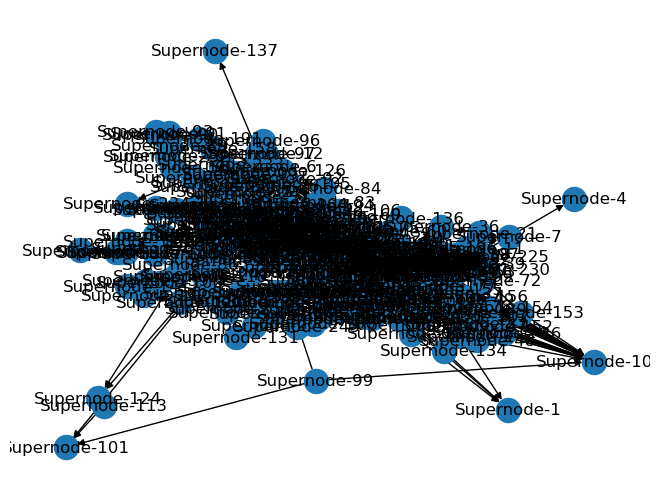

In [ ]:
g = mg[0].copy()
# add 'compartment' attribute to nodes
for node in g.nodes:
	if '_' in node:
		compartment = node.split('_')[-1]
		if compartment in ['c', 'm', 'e', 'x', 'l', 'r', 'v']:  # Add all valid compartments here
			g.nodes[node]['compartment'] = compartment
		else:
			g.nodes[node]['compartment'] = 'unknown'  # Assign a default compartment value
	else:
		g.nodes[node]['compartment'] = 'unknown'  # Assign a default compartment value
	# print(node, g.nodes[node])

# mg[0].nodes['udpg_c']
# nx.snap_aggregation(mg[0])
# nx.snap_aggregation(mg[0])

In [ ]:
# print all edge names
for edge in g.edges:
	# print(edge)
	print(edge, g.edges[edge])

('udpg_c', '13BDglucan_c') {'id': '13GS_c', 'label': '13GS_c\n(0.2646)', 'rounded_flux': 0.2646, 'flux': 0.2646304, 'width': 0.2646304, 'weight': 884.7199161547578}
('udpg_c', 'udp_c') {'id': 'TRE6PS_c', 'label': 'TRE6PS_c\n(0.0532)', 'rounded_flux': 0.0532, 'flux': 0.0532343, 'width': 0.0532343, 'weight': 4397.987487390649}
('udpg_c', '16BDglucan_en') {'id': '16GS_c', 'label': '16GS_c\n(0.0696)', 'rounded_flux': 0.0696, 'flux': 0.0696395, 'width': 0.0696395, 'weight': 3361.9394926729806}
('udpg_c', 'glycogen_c') {'id': 'GLYGS_c', 'label': 'GLYGS_c\n(0.0908)', 'rounded_flux': 0.0908, 'flux': 0.0907725, 'width': 0.0907725, 'weight': 2579.236941805062}
('udpg_c', 'tre6p_c') {'id': 'TRE6PS_c', 'label': 'TRE6PS_c\n(0.0532)', 'rounded_flux': 0.0532, 'flux': 0.0532343, 'width': 0.0532343, 'weight': 4397.987487390649}
('13BDglucan_c', 'co2_c') {'id': 'BIOMASS', 'label': 'BIOMASS\n(0.2579)', 'rounded_flux': 0.2579, 'flux': 0.25786984180352324, 'width': 0.25786984180352324, 'weight': 907.914565

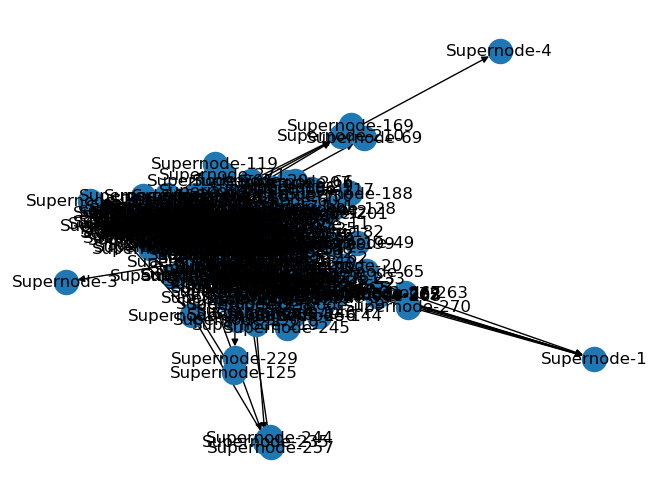

In [ ]:
g_sum = nx.snap_aggregation(g, node_attributes=('compartment',),edge_attributes=('id',),supernode_attribute='id') # the comma after 'compartment' is necessary
# g_sum = nx.snap_aggregation(g, node_attributes=('compartment',),supernode_attribute='compartment') # the comma after 'compartment' is necessary
nx.draw(g_sum, with_labels=True)

In [ ]:
for n in g_sum.nodes:
	print(n, g_sum.nodes[n])

Supernode-0 {'compartment': 'c', 'id': {'zn2_c', 'alatrna_c', 'glntrna_c', 'thrtrna_c', 'glutrna_c', 'dgtp_c', 'asptrna_c', 'lystrna_c', 'valtrna_c', 'mn2_c', 'dttp_c', 'leutrna_c', 'tre_c', 'glytrna_c', 'pc_c', 'ergstest_c', 'tag_c', 'iletrna_c', 'histrna_c', 'fe2_c', 'protrna_c', 'argtrna_c', 'dctp_c', 'glycogen_c', 'asntrna_c', 'cystrna_c', 'tyrtrna_c', 'mannan_c', 'ca2_c', 'cu2_c', 'k_c', 'sertrna_c', 'mettrna_c', 'phetrna_c', 'chtn_c', '13BDglucan_c', 'mg2_c', 'trptrna_c'}}
Supernode-1 {'compartment': 'unknown', 'id': {'o2_out', 'zn2_out', 'so4_out', 'nh4_out', 'mg2_out', 'ca2_out', 'k_out'}}
Supernode-2 {'compartment': 'm', 'id': {'o2_m', 'focytC_m'}}
Supernode-3 {'compartment': 'e', 'id': {'co2_e'}}
Supernode-4 {'compartment': 'r', 'id': {'dolmanp_r'}}
Supernode-5 {'compartment': 'c', 'id': {'ipdp_c'}}
Supernode-6 {'compartment': 'c', 'id': {'5mthf_c'}}
Supernode-7 {'compartment': 'c', 'id': {'dhor__S_c'}}
Supernode-8 {'compartment': 'c', 'id': {'stcoa_c'}}
Supernode-9 {'compart

In [ ]:
# # group edges that have the same name
# def group_edges(g):
# 	# find edges that have the same name
# 	edge_groups = {}
# 	for edge in g.edges:
# 		edge_name = g.edges[edge]['id']
# 		if edge_name not in edge_groups:
# 			edge_groups[edge_name] = []
# 		edge_groups[edge_name].append(edge)
# 	# combine the edges
# 	for edge_name in edge_groups:
# 		# get the edges
# 		edges = edge_groups[edge_name]
# 		# get the edge data
# 		edge_data = g.edges[edges[0]]
# 		# get the fluxes
# 		fluxes = [str(flux) for flux in str(edge_data['flux']).split(v_delim)]
# 		rounded_fluxes = [str(flux) for flux in str(edge_data['rounded_flux']).split(v_delim)]
# 		# combine the fluxes
# 		new_flux = v_delim.join(fluxes)
# 		new_rounded_flux = v_delim.join(rounded_fluxes)
# 		# add the edge
# 		g.add_edge(edges[0][0],edges[-1][1])
# 		nx.set_edge_attributes(g,{(edges[0][0],edges[-1][1]):edge_data})
# 		nx.set_edge_attributes(g,{(edges[0][0],edges[-1][1]):{'id':edge_name,'flux':new_flux,'rounded_flux':new_rounded_flux,'label':edge_name+'\n('+new_rounded_flux+')'}})
# 		# remove the old edges
# 		g.remove_edges_from(edges)
# 	return g

In [ ]:
# # DO NOT USE
# with model1a as m:
#     def find_pathways_v2(model,product_id,reactant_ids=None,flux_data=None,exclude_common_mets=True,stop_at_first=True,rxns_considered=None,pathways={}):
#         """UNFINISHED: find pathways that form a specified product in a model from a specified reactant (if provided).
#         \nBy default, to reduce time and improve accuracy, excludes water, lone protons, and metabolites commonly used as currency metabolites or cofactors (e.g. ATP, ADP, NADH, NADPH, etc.).
#         \nIf 'flux_data' is provided, only considers reactions with non-zero fluxes.
#         \nCheck for rxns that can make the product from the desired reactant, if provided. 
#         \nIf none found, check all rxns that consume the reactant and produce the product, 
#         \nrepeating with their respective reactants and products until the desired product is found 
#         \nor all rxns are checked."""
#         # pathways represented by nested dicts, 
#         #   starting w/ rxns making the target product and ending w/ rxns consuming the target reactant
#         target_reactants = None if reactant_ids is None else [model.metabolites.get_by_id(reactant).id for reactant in reactant_ids]
#         target_prod = model.metabolites.get_by_id(product_id)
#         if exclude_common_mets:
#             excluded_met_names = ['H2O','WATER','H','H+','PROTON','ATP','ADP','AMP','NADH','NADPH','NAD+','NADP+','NAD','NADP','NADH2','NADPH2','NADP(+)','NADP(H)','NAD(H)','NAD(P)H','NAD(P)','FAD','FADH2','FMN','FMNH2']
#             excluded_mets = []
#             mets_to_not_exclude = list(target_reactants) + list(target_prod.id) if target_reactants is not None else [target_prod.id]
#             # find all mets with names matching those in the excluded list
#             for met in model.metabolites:
#                 if met.id not in mets_to_not_exclude:
#                     if met.name in excluded_met_names:
#                         excluded_mets.append(met)
#                         # if the met is not a reactant or product of the target product, add it to the list of mets to exclude
#                     elif met.name in excluded_met_names:
#                         excluded_mets.append(met)
#         # if flux_data isn't provided, use stoichiometry for filtering; otherwise, use fluxes
#         if flux_data is None:
#             # take only rxns that can produce target_prod (positive flux possible and target_prod in products or negative flux possible and target_prod in reactants)
#             rxns_considered = model.reactions if rxns_considered is None else rxns_considered
#             rxns_making_target_prod = [rxn for rxn in target_prod.reactions if rxn.upper_bound > 0 and target_prod in rxn.products or rxn.lower_bound < 0 and target_prod in rxn.reactants]
#             rxns_to_check = rxns_making_target_prod
#             if target_reactants is not None:
#                 # check first for cases where the target reactant is in the reactants of the rxn
#                 for rxn in rxns_making_target_prod:
#                     for reactant in target_reactants:
#                         if rxn.upper_bound > 0 and reactant in rxn.reactants or rxn.lower_bound < 0 and reactant in rxn.products:
#                             pathways.append(rxn.id)
#                             # remove from rxns_to_check
#                             rxns_to_check.remove(rxn)
#                             if stop_at_first:
#                                 return pathways
#                             continue
#             else: # look for pathways connecting the target product to an extracellular metabolite
#                 for rxn in rxns_making_target_prod:
#                     # check if an exchange rxn makes the target product
#                     if rxn in model.boundary:
#                         pathways.append(rxn.id)
#                         # remove from rxns_to_check
#                         rxns_to_check.remove(rxn)
#                         if stop_at_first:
#                             return pathways
#                     # else:


#             if rxns_to_check == []:
#                 return pathways
#             # else:
#                 # for rxn in rxns_to_check:
#         else:
#             rxns_considered = [rxn for rxn in model.reactions if flux_data[rxn.id] != 0] if rxns_considered is None else rxns_considered
#             print(target_prod.summary())
#             # filter out rxns with zero flux
#             rxns_making_target_prod = [rxn for rxn in model.reactions if flux_data[rxn.id] != 0 and target_prod in rxn.products]
#             # rxns_making_target_prod = [rxn for rxn in model.reactions if rxn.id in target_prod.summary().producing_flux['reaction']]
#             rxns_to_check = rxns_making_target_prod
#             # if target_reactants is not None:

#         # while a complete pathway is not found, rerun this function
#         print("rxns_to_check:",rxns_to_check)
#         continue_search = True
#         # while continue_search:
#             # 
#         # find all products for target_prod
#         for rxn in rxns_making_target_prod:
#             # check if the rxn can produce target_prod
#             if rxn.upper_bound > 0 and target_prod in rxn.products:
#                 if target_reactants in rxn.reactants:
#                     pathways.append(rxn.id)
#                     # print("Pathway found:",pathways)
#                     if stop_at_first:
#                         break
#                 # else: # add the reactants of the rxn to the list of mets to check
#                     # for met in rxn.reactants:
#             elif rxn.lower_bound < 0 and target_prod in rxn.reactants:
#                 if target_reactants in rxn.products:
#                     pathways.append(rxn.id)
#                     if stop_at_first:
#                         break
#         return pathways
#     m.objective = []
#     find_pathways_v2(m, product, reactant_ids=["glc__D_c"], flux_data=model1_fluxes_dict, exclude_common_mets=True, stop_at_first=True, pathways={})
#     # find_pathways_v2(model1a, product, reactant_ids=None, stop_at_first=True, pathways={})
#     # update find_pathways based on find_pathways_v2, including adding zero values for fluxes of rxns not in flux_data

# non-pathway comparisons

In [ ]:
from cobra.io import load_model
from cobra.flux_analysis import gapfill
gapfill(model[0]['model'],model[1]['model'])
model = [{'model':deepcopy(model1a),'name':model1a.id},{'model':deepcopy(model2a),'name':model2a.id}]
# compare biomass stoichiometries
model[0]['biomass_rxn'] = model[0]['model'].reactions.get_by_id('BIOMASS')
model[1]['biomass_rxn'] = model[1]['model'].reactions.get_by_id('BIOMASS_AERO_SC_hvd')
model[0]['biomass'] = {k.id:v for k,v in model[0]['biomass_rxn'].metabolites.items()}
model[1]['biomass'] = {k.id:v for k,v in model[1]['biomass_rxn'].metabolites.items()}
# find metabolites with higher coefficients in model 0
model[0]['biomass_bigger_coeffs'] = {k:v for k,v in model[0]['biomass'].items() if k not in model[1]['biomass'] or abs(v)>abs(model[1]['biomass'][k])}
model[0]['biomass_bigger_coeffs']

# find metabolites in model 1's biomass rxn that aren't in model 0
for met in model[1]['biomass']:
	if met not in [m.id for m in model[0]['model'].metabolites]:
		model[0]['model'].add_metabolites([model[1]['model'].metabolites.get_by_id(met)])
		print('Metabolite not found in model 0:',met)
		can_make_met = False
		# add pathways to make this metabolite, including any missing metabolites

		# add all rxns that produce this metabolite
		for rxn in model[1]['model'].metabolites.get_by_id(met).reactions:
			# if rxn can be used or is the intended biomass rxn from model 1, add it
			# if rxn.lower_bound!=0 or rxn.upper_bound!=0 or rxn.id == model[1]['biomass_rxn'].id:
			if (rxn.lower_bound!=0) or rxn.upper_bound!=0 or rxn.id == model[1]['biomass_rxn'].id:
				print('Adding reaction:',rxn.id,rxn.lower_bound,rxn.upper_bound)
				model[0]['model'].add_reactions([rxn])
				# check if all reactants and products are in model 0
				mets_not_found = [rxn.metabolites.get_by_id(met2.id) for met2 in rxn.metabolites if met2.id not in [m.id for m in model[0]['model'].metabolites]]
				if len(mets_not_found)==0:
					can_make_met = True
					if rxn.id != model[1]['biomass_rxn'].id:
						break
		if not can_make_met:
			print('Metabolite not found in model 0:',met)
# save model 0
cobra.io.save_json_model(model[0]['model'],output_path+'model0.json')

Metabolite not found in model 0: ergst161_rm
Adding reaction: BIOMASS_AERO_SC_hvd 0.0 1000.0
Adding reaction: ERGST161t_l_rm -1000.0 1000.0


In [ ]:
# Metabolic models
# Extract the model names from the file names (remove the file extension)
model1_file = "../input/iRhtoC.json"
model2_file = "../input/release1-iRhtoC.json"
# model2_file = "../../../scRBA/build_model/input/GSM_iSace1144_rba.json"
# model1_file = "./input/iRhtoN.json"
# model2_file = "./input/rtRBA-N.json"

solver = 'glpk'
# solver = 'cplex'

# # rxns to exclude when creating combined model (e.g., due to them having renamed, updated versions)
# excluded_reactions = []
# excluded_reactions = ['compACYLCOA_c','compACYLCOA_l','compACYLCOA_m','compACYLCOA_r','compACYLCOA_rm','compACYLCOA_x','Biomass_Rt_Clim','compFALPD_mm','compFALPD_m','compFALPD_rm','compFALPD_en','compFALPD_c']

model1_name = os.path.splitext(os.path.basename(model1_file))[0]
model2_name = os.path.splitext(os.path.basename(model2_file))[0]
# model3_name = os.path.splitext(os.path.basename(model3_file))[0]

model1 = deepcopy(cobra.io.load_json_model(model1_file))
model2 = deepcopy(cobra.io.load_json_model(model2_file))
model1_dict = cobra.io.model_to_dict(model1)
model2_dict = cobra.io.model_to_dict(model2)
newer_or_preferred_model = model1
# model3 = cobra.io.load_json_model(model3_file)

print("Model 1 Name:", model1_name)
print("Original objective: ",model1.objective.direction," ",model1.objective.expression)
print("Model 2 Name:", model2_name)
print("Original objective: ",model2.objective.direction," ",model2.objective.expression)

# print("Model 3 Name:", model3_name)

obj1 = "BIOMASS"
# obj1 = "BIOMASS_RT_NLIM"
# obj2 = "BIOMASS"
obj2 = "BIOMASS"
# obj2 = "BIOMASS_RT_NLIM"

# Turn off N-limited rxns
# Create a list to store reactions with "nlim" in their IDs
conditional_reactions1 = []
# Create a list to store reactions with "clim" in their IDs
conditional_reactions2 = []
# Iterate through all reactions in the model
for reaction in model1.reactions:
    if "nlim" in reaction.id.lower():  # Case-insensitive search
        conditional_reactions1.append(reaction)
# Iterate through all reactions in the model
for reaction in model1.reactions:
    if "clim" in reaction.id.lower():  # Case-insensitive search
        conditional_reactions2.append(reaction)

# Print the reactions found
print("Inactive under C limitation:")
for reaction in conditional_reactions1:
    print(reaction.id)

Model 1 Name: iRhtoC
Original objective:  max   1.0*BIOMASS + 1.0*BIOMASS_MFA - 1.0*BIOMASS_MFA_reverse_19820 - 1.0*BIOMASS_reverse_69053
Model 2 Name: release2-iRhtoC
Original objective:  max   1.0*BIOMASS_RT_CLIM - 1.0*BIOMASS_RT_CLIM_reverse_12b42
Inactive under C limitation:


In [ ]:
# Names and total genes, rxns, metabolites
print(model1_name,"ID:", model1.id)
print(model2_name,"ID:", model2.id)

print(model1_name,"Name:", model1.name)
print(model2_name,"Name:", model2.name)

print("Number of Reactions in",model1_name,":", len(model1.reactions))
print("Number of Reactions in",model2_name,":", len(model2.reactions))

print("Number of Metabolites in",model1_name,":", len(model1.metabolites))
print("Number of Metabolites in",model2_name,":", len(model2.metabolites))

print("Number of Genes in",model1_name,":", len(model1.genes))
print("Number of Genes in",model2_name,":", len(model2.genes))

iRhtoC ID: iRhtoC
release2-iRhtoC ID: iRhto1108C
iRhtoC Name: iRhtoC
release2-iRhtoC Name: iRhto1108C
Number of Reactions in iRhtoC : 2317
Number of Reactions in release2-iRhtoC : 2251
Number of Metabolites in iRhtoC : 2097
Number of Metabolites in release2-iRhtoC : 2038
Number of Genes in iRhtoC : 1120
Number of Genes in release2-iRhtoC : 1111


In [ ]:
# in the future, move some of these into functions within packages
# maybe also start w/ gene comparisons (for easier GPR comparisons), then rxns (for easier metabolite comparisons), then mets, each building a list of synonyms to use for future reference
unique_reactions_model1 = []
unique_reactions_model2 = []
reaction_differences = set()
reaction_differences_dict = {}
different_reactions_model1 = []
different_reactions_model2 = []

unique_metabolites_model1 = []
unique_metabolites_model2 = []
metabolite_differences = set()
different_metabolites_model1 = []
different_metabolites_model2 = []

# Compare reactions
# for reaction in model1.reactions:
#     if reaction not in model2.reactions:
#         unique_reactions_model1.append(reaction)
def compareReactions(gsm1,gsm1_name,gsm1_unique,gsm1_different,gsm2,gsm2_name):
    for reaction1 in gsm1.reactions:
        try:
            possible_diffs = dict()
            rxns_found = 0
            reaction2 = None
            try:
                reaction2 = gsm2.reactions.get_by_id(reaction1.id)
                rxns_found = 1
            except:
                # if none found, try searching by stoichiometry
                for reaction in gsm2.reactions:
                    if reaction1.build_reaction_string() == reaction.build_reaction_string():
                        reaction2 = reaction
                        # print('Found reaction match to',reaction1.id,'by stoichiometry:',reaction2.id)
                        possible_diffs['id'] = {gsm1_name:reaction1.id,gsm2_name:reaction2.id}
                        rxns_found += 1
                        if rxns_found > 1:
                            print('Found multiple matches for',reaction1.id)
                            break
            if reaction1.id in reaction_differences_dict.keys() or reaction2.id in reaction_differences_dict.keys():
                # print('Already found differences for',reaction1.id,'or',reaction2.id)
                continue
            if not rxns_found:
                raise Exception
            # Compare reaction attributes (e.g., bounds, objective coefficient, etc.)
            # Compare bounds
            bounds_diff = (reaction1.lower_bound != reaction2.lower_bound) or (reaction1.upper_bound != reaction2.upper_bound)
            # Compare GPRs
            gpr_diff = (reaction1.gene_reaction_rule != reaction2.gene_reaction_rule)
            if gpr_diff:
                # check if none of the GPRs contain the word ' or ' or ' not '; if not, and they have the same genes, they are the same
                if all(phrase not in [reaction1.gene_reaction_rule,reaction2.gene_reaction_rule] for phrase in [' or ',' not ']):
                    gpr1 = set([i.id for i in reaction1.genes])
                    gpr2 = set([i.id for i in reaction2.genes])
                    # if the gene sets are the same, the GPRs are the same
                    if gpr1 == gpr2:
                        gpr_diff = False

            # Compare stoichiometries (comparing as sets). Remove arrows to avoid redundant comparisons in bounds.
            stoichiometry_diff = reaction1.build_reaction_string().replace("<=>","").replace("-->","").replace("<--","") != reaction2.build_reaction_string().replace("<=>","").replace("-->","").replace("<--","")
            if bounds_diff or gpr_diff or stoichiometry_diff or possible_diffs:
                differences = []
                rxn_diff_dict = {}
                if bounds_diff:
                    # differences.append(f"Bounds [({reaction1.lower_bound}, {reaction1.upper_bound}) in {gsm1_name}, ({reaction2.lower_bound}, {reaction2.upper_bound}) in {gsm2_name}]")
                    differences.append("Bounds")
                    rxn_diff_dict['bounds'] = {gsm1_name:[reaction1.lower_bound, reaction1.upper_bound],gsm2_name:[reaction2.lower_bound, reaction2.upper_bound]}
                if gpr_diff:
                    differences.append("GPRs")
                    rxn_diff_dict['gpr'] = {gsm1_name:reaction1.gene_reaction_rule,gsm2_name:reaction2.gene_reaction_rule}
                if stoichiometry_diff:
                    differences.append("Stoichiometries")
                    rxn_diff_dict['stoichiometry'] = {gsm1_name:reaction1.build_reaction_string(),gsm2_name:reaction2.build_reaction_string()}
                # if rxn not already listed in differences, add it
                if reaction1.id not in gsm1_different:
                    reaction_differences.add(f"Differences in {', '.join(differences)} for reaction '{reaction1.id}'")
                    gsm1_different.append(reaction1)
                    reaction_differences_dict[reaction1.id] = rxn_diff_dict
        except:
            # Reaction is in model1 but not in model2
            #gsm1_unique.append(f"Reaction in {gsm1_name} but not in {gsm2_name}: {reaction1.id}")
            gsm1_unique.append(reaction1)

compareReactions(model1,model1_name,unique_reactions_model1,different_reactions_model1,model2,model2_name)
compareReactions(model2,model2_name,unique_reactions_model2,different_reactions_model2,model1,model1_name)
# make csv file with column for rxn name and column for category (0 by default, 1 if in unique_reactions_model1, 2 if in unique_reactions_model2)
df = pd.DataFrame(columns=['rxn_name','category'])
for rxn in model1.reactions:
    df.loc[len(df)] = {'rxn_name': rxn.id, 'category': 0}
for rxn in unique_reactions_model1:
    df.loc[len(df)] = {'rxn_name': rxn.id, 'category': 1}
for rxn in unique_reactions_model2:
    df.loc[len(df)] = {'rxn_name': rxn.id, 'category': 2}
for rxn in reaction_differences_dict:
    # if 'bounds' in reaction_differences_dict[rxn]:
        # if reaction_differences_dict[rxn]['bounds']:
    df.loc[len(df)] = {'rxn_name': rxn, 'category': 3}
    
df.to_csv('unique_rxns.csv',index=False)

def compareMetabolites(gsm1,gsm1_name,gsm1_unique,gsm1_different,gsm2,gsm2_name):
    for met1 in gsm1.metabolites:
        try:
            met2 = gsm2.metabolites.get_by_id(met1.id)
            formula_diff = (met1.formula != met2.formula)
            compartment_diff = (met1.compartment != met2.compartment)
            if formula_diff or compartment_diff:
                differences = []
                if formula_diff:
                    differences.append("Formulas")
                if compartment_diff:
                    differences.append("Compartments")
                metabolite_differences.add(f"Differences in {', '.join(differences)} for '{met1.id}'")
                gsm1_different.append(met1)
        except:
            # Reaction is in model1 but not in model2
            #gsm1_unique.append(f"Metabolite in {gsm1_name} but not in {gsm2_name}: {met1.id}")
            gsm1_unique.append(met1)

compareMetabolites(model1,model1_name,unique_metabolites_model1,different_metabolites_model1,model2,model2_name)
compareMetabolites(model2,model2_name,unique_metabolites_model2,different_metabolites_model2,model1,model1_name)

# Compare metabolites
# for metabolite in model1.metabolites:
#     if metabolite not in model2.metabolites:
#         unique_metabolites_model1.append(metabolite)

# for metabolite in model2.metabolites:
#     if metabolite not in model1.metabolites:
#         unique_metabolites_model2.append(metabolite)

# Print the unique reactions and metabolites for each model
print("\n# Metabolites unique to",model1_name,":")
for metabolite in unique_metabolites_model1:
    print("\t","Metabolite unique to",model1_name,":",metabolite)

print("\n# Metabolites unique to",model2_name,":")
for metabolite in unique_metabolites_model2:
    print("\t",metabolite)

print("\n# Metabolites with different versions present:")
for metabolite in metabolite_differences:
    print("\t",metabolite)

print("\n# Reactions unique to",model1_name,":")
for reaction in unique_reactions_model1:
    # print(reaction.id)
    print("\t","Rxn unique to",model1_name,":",reaction)

print("\n# Reactions unique to",model2_name,":")
for reaction in unique_reactions_model2:
    print("\t",reaction)

print("\n# Reactions with different versions present:")
# for reaction in reaction_differences:
#     print("\t",reaction)
# rxn_diff_types = set(list(reaction_differences_dict[rxn].keys()) for rxn in reaction_differences_dict)
rxn_diff_types = set()
for rxn in reaction_differences_dict:
    rxn_diff_types.update(reaction_differences_dict[rxn].keys())
# make CSV file with columns for rxn names, subsystems, which models they are in, and differences between them in each model (if in both) - with each difference type as its own column
df = pd.DataFrame(columns=['rxn_name','subsystem','in '+model1.id,'in '+model2.id] + list(rxn_diff_types))
# add new row for each rxn

for rxn in reaction_differences_dict:
    rxn_in_model = model1.reactions.get_by_id(rxn)
    all_diffs = {diff: None for diff in rxn_diff_types}
    for diff in rxn_diff_types:
        if diff in reaction_differences_dict[rxn]:
            all_diffs[diff] = reaction_differences_dict[rxn][diff]
    df.loc[len(df)] = {'rxn_name': rxn_in_model.id, 'subsystem': rxn_in_model.subsystem, 'in '+model1.id: 1, 'in '+model2.id: 1, **all_diffs}
    # df.loc[len(df)] = {'rxn_name': rxn_in_model.id, 'subsystem': rxn_in_model.subsystem, 'in '+model1.id: 1, 'in '+model2.id: 1}
    # df.loc[len(df)].update({diff: None for diff in rxn_diff_types})    # if 'bounds' in reaction_differences_dict[rxn] or 'stoichiometry' in reaction_differences_dict[rxn]:
    print("\t"+rxn)
    for diff in reaction_differences_dict[rxn]:
        print("\t\t"+diff)
        # rxn_diff_types.add(diff)
        for model in reaction_differences_dict[rxn][diff]:
            print("\t\t\t"+model+":",reaction_differences_dict[rxn][diff][model])
            # df.loc[len(df)-1,diff] = tuple(reaction_differences_dict[rxn][diff][model])
            # df.loc[len(df)-1,diff] = reaction_differences_dict[rxn][diff][model]
print("\n")
for rxn in unique_reactions_model1:
    rxn_in_model = model1.reactions.get_by_id(rxn.id)
    df.loc[len(df)] = {'rxn_name': rxn_in_model.id, 'subsystem': rxn_in_model.subsystem, 'in '+model1.id: 1, 'in '+model2.id: 0}
for rxn in unique_reactions_model2:
    rxn_in_model = model2.reactions.get_by_id(rxn.id)
    df.loc[len(df)] = {'rxn_name': rxn_in_model.id, 'subsystem': rxn_in_model.subsystem, 'in '+model1.id: 0, 'in '+model2.id: 1}
df.to_csv(model1.id+'-vs-'+model2.id+'.csv',index=False)


# Metabolites unique to iRhtoC :
	 Metabolite unique to iRhtoC : CATION1_en
	 Metabolite unique to iRhtoC : CATION1_vm
	 Metabolite unique to iRhtoC : CATION1_gm
	 Metabolite unique to iRhtoC : CATION1_mm
	 Metabolite unique to iRhtoC : CATION1_rm
	 Metabolite unique to iRhtoC : CATION1_v
	 Metabolite unique to iRhtoC : CATION1_x
	 Metabolite unique to iRhtoC : CATION1_n
	 Metabolite unique to iRhtoC : CATION1_m
	 Metabolite unique to iRhtoC : CATION1_l
	 Metabolite unique to iRhtoC : CATION1_g
	 Metabolite unique to iRhtoC : CATION1_c
	 Metabolite unique to iRhtoC : CATION1_r
	 Metabolite unique to iRhtoC : CATION1_e
	 Metabolite unique to iRhtoC : metal2_c
	 Metabolite unique to iRhtoC : metal2_e
	 Metabolite unique to iRhtoC : metal2_m
	 Metabolite unique to iRhtoC : metal2_x
	 Metabolite unique to iRhtoC : feCATION_c
	 Metabolite unique to iRhtoC : feCATION_e
	 Metabolite unique to iRhtoC : feCATION_m
	 Metabolite unique to iRhtoC : feCATION_n
	 Metabolite unique to iRhtoC : mg2or

In [ ]:
print("Total reactions in both models:",model1_name,len(model1.reactions),model2_name,len(model2.reactions))
# print total number of unique reactions and metabolites and ones with different versions
print("Total number of unique reactions in",model1_name,":",len(unique_reactions_model1))
print("Total number of unique reactions in",model2_name,":",len(unique_reactions_model2))
print("Total number of reactions with different versions in",model1_name,"and",model2_name,":",len(reaction_differences))
print("Total number of unique metabolites in",model1_name,":",len(unique_metabolites_model1))
print("Total number of unique metabolites in",model2_name,":",len(unique_metabolites_model2))
print("Total number of metabolites with different versions in",model1_name,"and",model2_name,":",len(metabolite_differences))

Total reactions in both models: iRhtoC 2317 GSM_iSace1144_rba 1895
Total number of unique reactions in iRhtoC : 703
Total number of unique reactions in GSM_iSace1144_rba : 281
Total number of reactions with different versions in iRhtoC and GSM_iSace1144_rba : 1437
Total number of unique metabolites in iRhtoC : 602
Total number of unique metabolites in GSM_iSace1144_rba : 557
Total number of metabolites with different versions in iRhtoC and GSM_iSace1144_rba : 20


In [ ]:
# make csv file with reaction_differences_dict, with columns for rxn name, bounds, gpr, stoichiometry and their values for each model
# columns are blank if no difference is present
df = pd.DataFrame(columns=['rxn_name','subsystem','bounds_changes','gpr_changes','stoichiometry_changes'])
for rxn in reaction_differences_dict:
    df.loc[len(df)] = {'rxn_name': rxn, 'subsystem': model1.reactions.get_by_id(rxn), 'bounds_changes': reaction_differences_dict[rxn].get('bounds'), 'gpr_changes': reaction_differences_dict[rxn].get('gpr'), 'stoichiometry_changes': reaction_differences_dict[rxn].get('stoichiometry')}
df.to_csv('different_rxns.csv',index=False)

In [ ]:
# if escher map provided, determine which rxns from both models aren't in there
escher_map = "new_map (5).json"
# parse json
import json
with open(escher_map) as f:
    data = json.load(f)
# get all rxns in escher map
escher_rxns = set()
for k, v in data[1]['reactions'].items():
    # print(k,v)
    escher_rxns.add(v['bigg_id'])
# get all rxns in both models
print(escher_rxns)
# get all rxns in both models as a set
model1_rxns = set([rxn.id for rxn in model1.reactions])
model2_rxns = set([rxn.id for rxn in model2.reactions])
# check if all rxns in escher map are in either model
non_rxns = []
for rxn in escher_rxns:
    if rxn not in model1_rxns and rxn not in model2_rxns:
        non_rxns.append(rxn)
if non_rxns:
    print("The following reactions are in the escher map but not in either model:")
    print(non_rxns)
# find rxns in both models that aren't in escher map
rxns_not_in_escher = model1_rxns.union(model2_rxns).difference(escher_rxns)
print("The following reactions are in both models but not in the escher map:")
print(rxns_not_in_escher)

{'MI1PP_c', 'GAPD_c', 'MTMOHT_m', 'NDPK2_c', 'PYRtps_m', 'EX_co2_e', 'NDPK5_c', 'OGLYCANS2_g', 'PAP_rm', 'ECOAR220_rm', 'C4STMO3_c', 'MALCOAt_c_rm', 'PSCIT_c', 'ACGK_m', 'HSERTA_c', 'ORPT_c', '3HAD140_c', 'ACITL_c', 'PGL_c', 'C5STDS_c', 'CYSTS_c', 'DHAPt_c_rm', 'G5SADr_c', 'MCOATA_c', 'CHORS_c', 'uniDOLDP_l', 'NNATi_c', 'PRMICI_c', 'C3STKR1_c', 'HCITR_m', '2OXOADPt_c_m', 'AOXS_c', 'UMPK_c', 'ADPATPt_c_m', 'ATPPRT_c', 'M1PS_c', 'ANPRT_c', 'TMPPP_c', 'CDPDAGS_rm', 'IPDPt_c_l', 'PPCDC_c', 'HEX1_c', 'HISTP_c', 'PGM_c', '3OACR220_rm', 'RNDR1_c', 'G6PDH2i_c', 'IGPS_c', 'PMTCOAt_c_rm', 'OGLYCANS4_g', 'AMAOTr_c', 'TTCCOAt_c_r', 'SBP_c', 'ADK1_c', '3HAD100_c', 'PCOATA160_c', '2OBUTt_c_m', '16GS_c', 'GLNS_c', 'ORNTA_c', 'KARA1i_m', 'PSP_L_c', 'FMNRx2_c', 'ACOTAi_m', 'PRFGS_c', 'LEUTA_c', 'PMANM_c', 'PTPAT_c', 'OGLYCANS3_g', 'DPCOAK_c', 'DRAPPRy_c', 'AKGDb_m', 'ANS_c', 'PPPG9t_c_m', 'PRENT6_l', 'PItps_m', 'ADMDC_c', 'ORNtpa_m', 'ACOADS160_rm', 'GPIA6_r', 'FRDPt_c_l', 'GPIA8a_r', 'NADHcplxI_c_m', 

In [ ]:
# Perform FBA on Model 1
print(f"Models have identical media? {model1.medium == model1.medium}")
# model1.medium = {'EX_glc__D_e':5.3317693,'EX_4abz_e':0.25,'EX_btn_c':0.01,'EX_ca2_e':1000,'EX_cl_e':1000,'EX_cobalt2_e':1000,'EX_cu2_e':1000,'EX_fe2_e':1000,'EX_fe3_e':1000,'EX_fol_e':0.25,'EX_h_e':1000,'EX_h2o_e':1000,'EX_inost_e':0.25,'EX_k_e':1000,'EX_mg2_e':1000,'EX_mn2_e':1000,'EX_na1_e':1000,'EX_nac_e':0.25,'EX_nh4_e':1000,'EX_ni2_e':1000,'EX_o2_e':1000,'EX_pi_e':1000,'EX_pnto__R_e':0.25,'EX_pydxn_e':0.25,'EX_ribflv_e':0.25,'EX_so4_e':1000,'EX_thm_e':0.25,'EX_zn2_e':1000}
# model2.medium = {'EX_glc__D_e':5.3317693,'EX_4abz_e':0.25,'EX_btn_c':0.01,'EX_ca2_e':1000,'EX_cl_e':1000,'EX_cobalt2_e':1000,'EX_cu2_e':1000,'EX_fe2_e':1000,'EX_fe3_e':1000,'EX_fol_e':0.25,'EX_h_e':1000,'EX_h2o_e':1000,'EX_inost_e':0.25,'EX_k_e':1000,'EX_mg2_e':1000,'EX_mn2_e':1000,'EX_na1_e':1000,'EX_nac_e':0.25,'EX_nh4_e':1000,'EX_ni2_e':1000,'EX_o2_e':1000,'EX_pi_e':1000,'EX_pnto__R_e':0.25,'EX_pydxn_e':0.25,'EX_ribflv_e':0.25,'EX_so4_e':1000,'EX_thm_e':0.25,'EX_zn2_e':1000}

solution1 = model1.optimize()
# print(solution1.fluxes["DM_fe3_m"])

# Perform FBA on Model 2
solution2 = model2.optimize()

print(model1_name,"Objective Value:", solution1.objective_value)
print(model2_name,"Objective Value:", solution2.objective_value)

Models have identical media? True
iRhtoC Objective Value: 0.3759311337313489
release1-iRhtoC Objective Value: 0.3753060889842424


In [ ]:
model1.medium == model2.medium

True

In [ ]:
# Copy the target model to preserve its structure
model1copy = deepcopy(model1)
model1copy.solver = solver

model1copy.add_metabolites(unique_metabolites_model2)

addedRxns = []
for rxn in unique_reactions_model2:
    if rxn.id not in excluded_reactions and rxn.id not in conditional_reactions1:
        addedRxns.append(rxn)
model1copy.add_reactions(addedRxns)

# remove inactive conditional rxns
for rxn in conditional_reactions1:
    rxnToUpdate = model1copy.reactions.get_by_id(rxn.id)
    model1copy.remove_reactions(rxnToUpdate)

# Now, the model1copy contains reactions from the model2
# with modified bounds or other properties as needed.

# Perform FBA on Model 1
solution1 = model1copy.optimize()

# Perform FBA on Model 2
solution2 = model2.optimize()

print("Objective: ",model1copy.objective.direction," ",model1copy.objective.expression)
print(model1_name,"Objective Value:", solution1.objective_value)
print("Objective: ",model2.objective.direction," ",model2.objective.expression)
print(model2_name,"Objective Value:", solution2.objective_value)


Objective:  max   1.0*BIOMASS_RT_CLIM - 1.0*BIOMASS_RT_CLIM_reverse_12b42
iRhtoC Objective Value: 0.3759311337313277
Objective:  max   1.0*BIOMASS_RT_CLIM - 1.0*BIOMASS_RT_CLIM_reverse_12b42
release2-iRhtoC Objective Value: 0.390188398854231


In [ ]:
# Optional calculations for comparing flux to experimental results.
# In this case, converting fluxes in mmol/gDW*h to max yield in g cell/g glucose is calculated.
referencedModel = model1copy
referencedSolution = solution1
unitsInput = 'mmol/gDW*h'
unitsOutput = 'g cell/g glucose'
benchmarkMet = referencedModel.metabolites.get_by_id('glc__D_c')
benchmarkMetMW = benchmarkMet.formula_weight
benchmarkRxn = referencedModel.reactions.get_by_id('EX_glc__D_e')

rxnsOfInterest = [obj1]
for rxn in rxnsOfInterest: 
    rxnsource = referencedModel.reactions.get_by_id(rxn)
    result = referencedSolution.fluxes[rxnsource.id] / referencedSolution.fluxes[benchmarkRxn.id]
    print(referencedSolution.fluxes[rxnsource.id])
    print('Result of converting',unitsInput,'to',unitsOutput,'for',rxn,':',result)

0.3759311337313277
Result of converting mmol/gDW*h to g cell/g glucose for BIOMASS_RT_CLIM : -0.07518622674626554


In [ ]:
# Adding individual rxns to model1copy (iRhtoCN)
modelA = deepcopy(model1copy)
modelA.solver = solver
# for met in different_metabolites_model1:
#     metToUpdate = modelA.metabolites.get_by_id(met.id)
#     modelA.remove_metabolites(metToUpdate)
# modelA.add_metabolites(different_metabolites_model1)

# addnow = ['DCMPDA_c','GLYCL_m','CTPS1_c','PKETF_c','FRD_c','ATPS_m','FADH2t_c_m','GLUt_c_m','HCO3E_e','CITMALta_m','DDPA_m','FECRq9_m']
#addnow = ['ATPS_m']
addnow = []
added = []

# for rxn in different_reactions_model2:
#     if (rxn.id not in excluded_reactions) and (rxn.id not in conditional_reactions1) and (rxn.id in addnow):
#         rxnToUpdate = modelA.reactions.get_by_id(rxn.id)
#         modelA.remove_reactions(rxnToUpdate)
#         added.append(model2.reactions.get_by_id(rxn.id))
# modelA.add_reactions(added)

# modelA.objective = model1.objective
print("Medium for updated model: ",modelA.medium)
print("Medium for model used to update it: ",model2.medium)
# modelA.medium = model1copy.medium

# Now, the modelA contains reactions from the model2
# with modified bounds or other properties as needed.

# Perform FBA on Model 1
solution1 = modelA.optimize()
# Perform FBA on Model 2
solution2 = model2.optimize()

print(model1_name,"Objective:",modelA.objective.expression,"Objective Value:", solution1.objective_value)
print(model2_name,"Objective:",model2.objective.expression,"Objective Value:", solution2.objective_value)

Medium for updated model:  {'EX_nh4_e': 1000.0, 'EX_glc__D_e': 5.0, 'EX_fe2_e': 1000.0, 'EX_o2_e': 1000.0, 'EX_pi_e': 1000.0, 'EX_na1_e': 1000.0, 'EX_so4_e': 1000.0, 'EX_h_e': 1000.0, 'EX_k_e': 1000.0, 'EX_h2o_e': 1000.0, 'EX_ca2_e': 1000.0, 'EX_cl_e': 1000.0, 'EX_cobalt2_e': 1000.0, 'EX_cu2_e': 1000.0, 'EX_mg2_e': 1000.0, 'EX_mn2_e': 1000.0, 'EX_ni2_e': 1000.0, 'EX_zn2_e': 1000.0, 'EX_btn_c': 0.01}
Medium for model used to update it:  {'EX_nh4_e': 1000.0, 'EX_glc__D_e': 5.0, 'EX_fe2_e': 1000.0, 'EX_o2_e': 1000.0, 'EX_pi_e': 1000.0, 'EX_na1_e': 1000.0, 'EX_so4_e': 1000.0, 'EX_h_e': 1000.0, 'EX_k_e': 1000.0, 'EX_h2o_e': 1000.0, 'EX_ca2_e': 1000.0, 'EX_cl_e': 1000.0, 'EX_cobalt2_e': 1000.0, 'EX_cu2_e': 1000.0, 'EX_mg2_e': 1000.0, 'EX_mn2_e': 1000.0, 'EX_ni2_e': 1000.0, 'EX_zn2_e': 1000.0, 'EX_btn_c': 0.01}
iRhtoC Objective: 1.0*BIOMASS_RT_CLIM - 1.0*BIOMASS_RT_CLIM_reverse_12b42 Objective Value: 0.3759311337313312
release2-iRhtoC Objective: 1.0*BIOMASS_RT_CLIM - 1.0*BIOMASS_RT_CLIM_rever

In [ ]:
import inspect

class NamedDict:
    def __init__(self, dictionary):
        calling_frame = inspect.currentframe().f_back
        self.name = [var_name for var_name, var in calling_frame.f_locals.items() if var is dictionary][0]
        self.dictionary = dictionary

def compare_and_print_dicts(*named_dicts):
    for i, named_dict1 in enumerate(named_dicts):
        for j, named_dict2 in enumerate(named_dicts):
            if i != j:
                dict1_name = named_dict1.name
                dict2_name = named_dict2.name
                
                dict1 = named_dict1.dictionary
                dict2 = named_dict2.dictionary

                # Find keys unique to each dictionary
                unique_keys_dict1 = [key for key in dict1 if key not in dict2]
                unique_keys_dict2 = [key for key in dict2 if key not in dict1]

                # Find keys with differing values
                differing_values = [(key, dict1[key], dict2[key]) for key in dict1 if key in dict2 and dict1[key] != dict2[key]]

                # Print results
                print(f"{dict1_name}: {dict1}")
                print(f"{dict2_name}: {dict2}")
                print(f"Keys unique to {dict1_name}: {unique_keys_dict1}")
                print(f"Keys unique to {dict2_name}: {unique_keys_dict2}")
                print(f"Keys with differing values: {differing_values}")

# Example usage
dict1 = dict(modelA.medium)
dict2 = dict(model2.medium)

# Create instances of NamedDict using the inferred variable names
named_dict1 = NamedDict(dict1)
named_dict2 = NamedDict(dict2)

# Call the function with the instances of NamedDict
compare_and_print_dicts(named_dict1, named_dict2)

# Call the function with the instances of NamedDict
compare_and_print_dicts(NamedDict(dict1a), NamedDict(dict2a))

In [ ]:
# Try adding model2 versions of model1 rxns and metabolites - previous version seemed to just use model1 rxns
# For some reason, model1copy already seems to use model2 versions of some model1 rxns before this stage
for met in different_metabolites_model1:
    metToUpdate = model1copy.metabolites.get_by_id(met.id)
    model1copy.remove_metabolites(metToUpdate)
model1copy.add_metabolites(different_metabolites_model1)

for rxn in different_reactions_model1:
    if rxn.id not in excluded_reactions and rxn.id not in conditional_reactions1:
        rxnToUpdate = model1copy.reactions.get_by_id(rxn.id)
        model1copy.remove_reactions(rxnToUpdate)
model1copy.add_reactions(different_reactions_model1)

# model1copy.objective = model1.objective
print("Medium for updated model: ",model1copy.medium)
print("Medium for model used to update it: ",model2.medium)

# Now, the model1copy contains reactions from the model2
# with modified bounds or other properties as needed.

# Perform FBA on Model 1
solution1 = model1copy.optimize()
# Perform FBA on Model 2
solution2 = model2.optimize()

print(model1_name,"Objective Value:", solution1.objective_value)
print(model2_name,"Objective Value:", solution2.objective_value)

In [ ]:
# Try adding model2 versions of model1 rxns and metabolites
for met in different_metabolites_model2:
    metToUpdate = model1copy.metabolites.get_by_id(met.id)
    model1copy.remove_metabolites(metToUpdate)
model1copy.add_metabolites(different_metabolites_model2)

for rxn in different_reactions_model2:
    if rxn.id not in excluded_reactions and rxn.id not in conditional_reactions1:
        rxnToUpdate = model1copy.reactions.get_by_id(rxn.id)
        model1copy.remove_reactions(rxnToUpdate)
model1copy.add_reactions(different_reactions_model2)

# model1copy.objective = model1.objective
print("Medium for updated model: ",model1copy.medium)
print("Medium for model used to update it: ",model2.medium)

# Now, the model1copy contains reactions from the model2
# with modified bounds or other properties as needed.

# Perform FBA on Model 1
solution1 = model1copy.optimize()
# Perform FBA on Model 2
solution2 = model2.optimize()

print(model1_name,"Objective Value:", solution1.objective_value)
print(model2_name,"Objective Value:", solution2.objective_value)


In [ ]:
# run FVA on model1 and model2; compare results among reactions in both models
from cobra.flux_analysis import flux_variability_analysis

# fvagsm = model1copy
# fvagsm.objective = obj1
# fvalist = [entry in different_reactions_model2 if entry.id != obj1]
# print(model1copy.objective)

# Run FVA on model1
fva_model1 = flux_variability_analysis(model1)

# Run FVA on model2
fva_model2 = flux_variability_analysis(model2)

THFAT_m: h2o_m + methf_m --> 5fthf_m + h_m
FMNRx_c: fmn_c + 2.0 h_c + nadh_c --> fmnh2_c + nad_c
FMNRx2_c: fmn_c + 2.0 h_c + nadph_c --> fmnh2_c + nadp_c
ADPh_c: adp_c + h2o_c --> amp_c + h_c + pi_c
ADPh_m: adp_m + h2o_m --> amp_m + h_m + pi_m
tpscu2_c_m: cu2_c <=> cu2_m
GENERIC_na1CATION1_c: na1_c --> CATION1_c
GENERIC_na1CATION1_e: na1_e --> CATION1_e
GENERIC_kCATION1_m: k_m --> CATION1_m
GENERIC_kCATION1_e: k_e --> CATION1_e
GENERIC_kCATION1_c: k_c --> CATION1_c
GENERIC_hCATION1_en: h_en --> CATION1_en
GENERIC_hCATION1_vm: h_vm --> CATION1_vm
GENERIC_hCATION1_gm: h_gm --> CATION1_gm
GENERIC_hCATION1_mm: h_mm --> CATION1_mm
GENERIC_hCATION1_rm: h_rm --> CATION1_rm
GENERIC_hCATION1_v: h_v --> CATION1_v
GENERIC_hCATION1_x: h_x --> CATION1_x
GENERIC_hCATION1_n: h_n --> CATION1_n
GENERIC_hCATION1_m: h_m --> CATION1_m
GENERIC_hCATION1_l: h_l --> CATION1_l
GENERIC_hCATION1_g: h_g --> CATION1_g
GENERIC_hCATION1_c: h_c --> CATION1_c
GENERIC_hCATION1_r: h_r --> CATION1_r
GENERIC_hCATION1_e: h

KeyError: <Reaction RLFC2O_c at 0x27541b76a60>

Reaction RLFC2O_c has different FVA results between model1 and model2:
Model1: Minimum = 0.0, Maximum = -4.697627658700228e-13
Model2: Minimum = 0.0, Maximum = -9.283845797201664e-13
Reaction RLFC2O_m has different FVA results between model1 and model2:
Model1: Minimum = 0.0, Maximum = 7.758239249426293e-13
Model2: Minimum = 0.0, Maximum = -3.366116375795384e-13
Reaction BTDDH_c has different FVA results between model1 and model2:
Model1: Minimum = 1.0071090111213403e-13, Maximum = 0.0
Model2: Minimum = 1.1815803741892676e-13, Maximum = 0.0
Reaction LLFC2O_c has different FVA results between model1 and model2:
Model1: Minimum = -2.833778842401752e-15, Maximum = 8.940491025534423e-13
Model2: Minimum = 0.0, Maximum = -1.1300948714392411e-13
Reaction 13GS_c has different FVA results between model1 and model2:
Model1: Minimum = 0.3763533043945013, Maximum = 0.3763533043945103
Model2: Minimum = 0.3757275577221732, Maximum = 0.3757275577221727
Reaction 16GS_c has different FVA results betwee

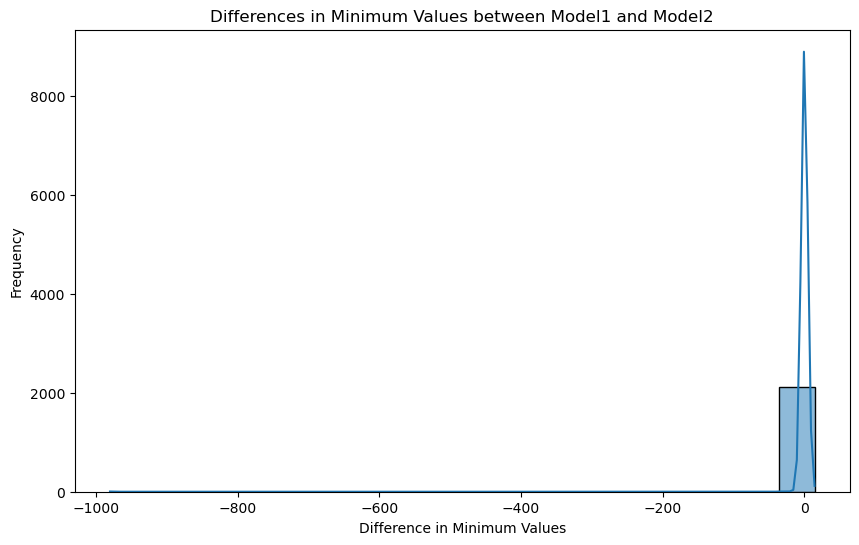

,Model1 Minimum,Model1 Maximum,Model2 Minimum,Model2 Maximum,Minimum Difference,Maximum Difference,Abs Min Difference,Abs Max Difference,Max Difference
AKGMALta_m,19.703951,1.000000e+03,6.027693,8.044133e+00,13.676259,991.955867,13.676259,991.955867,991.955867
CITMALta_m,-980.296049,-2.025201e-11,0.000000,1.975493e+00,-980.296049,-1.975493,980.296049,1.975493,980.296049
AKGCITta_m,0.000000,9.802960e+02,0.000000,1.975493e+00,0.000000,978.320556,0.000000,978.320556,978.320556
ATPS_m,25.072006,2.507201e+01,58.453743,5.845374e+01,-33.381736,-33.381736,33.381736,33.381736,33.381736
H2Ot_c_m,-95.393401,-9.539340e+01,-75.169178,-7.516918e+01,-20.224223,-20.224223,20.224223,20.224223,20.224223
...,...,...,...,...,...,...,...,...,...
THFAT_m,0.000000,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TMABADH_m,0.000000,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
XU5PFGT_c,NaN,NaN,0.000000,-4.708657e-12,NaN,NaN,NaN,NaN,NaN
XU5PFGT_x,0.000000,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Compare the FVA results
for reaction_id in model1.reactions:
    if reaction_id.id in fva_model1.index and reaction_id.id in fva_model2.index:
        fva_result_model1 = fva_model1.loc[reaction_id.id]
        fva_result_model2 = fva_model2.loc[reaction_id.id]
        if fva_result_model1["minimum"] != fva_result_model2["minimum"] or fva_result_model1["maximum"] != fva_result_model2["maximum"]:
            print(f"Reaction {reaction_id.id} has different FVA results between model1 and model2:")
            print(f"Model1: Minimum = {fva_result_model1['minimum']}, Maximum = {fva_result_model1['maximum']}")
            print(f"Model2: Minimum = {fva_result_model2['minimum']}, Maximum = {fva_result_model2['maximum']}")
# plot the differences in FVA results
import matplotlib.pyplot as plt
import seaborn as sns

# Create a DataFrame with the FVA results
fva_results = pd.DataFrame({"Model1 Minimum": fva_model1["minimum"], "Model1 Maximum": fva_model1["maximum"],
                            "Model2 Minimum": fva_model2["minimum"], "Model2 Maximum": fva_model2["maximum"]})

# Create a new column to store the differences in the minimum values
fva_results["Minimum Difference"] = fva_results["Model1 Minimum"] - fva_results["Model2 Minimum"]

# Create a new column to store the differences in the maximum values
fva_results["Maximum Difference"] = fva_results["Model1 Maximum"] - fva_results["Model2 Maximum"]

# Plot the differences in the minimum values
plt.figure(figsize=(10, 6))
sns.histplot(fva_results["Minimum Difference"], bins=20, kde=True)
plt.xlabel("Difference in Minimum Values")
plt.ylabel("Frequency")
plt.title("Differences in Minimum Values between Model1 and Model2")
plt.show()

# show a list of rxns, sorted by highest to lowest difference in either minimum or maximum values
fva_results["Abs Min Difference"] = abs(fva_results["Minimum Difference"])
fva_results["Abs Max Difference"] = abs(fva_results["Maximum Difference"])
fva_results["Max Difference"] = fva_results[["Abs Min Difference","Abs Max Difference"]].max(axis=1)
fva_results = fva_results.sort_values(by="Max Difference", ascending=False)
display(fva_results)
# make csv file of fva results
fva_results.to_csv('fva_results.csv',index=True)


In [ ]:
cobra.io.save_json_model(model1copy,model1_name+"_overwritten_by_"+model2_name+".json")

In [ ]:
# Optional calculations for comparing flux to experimental results.
# In this case, converting fluxes in mmol/gDW*h to max yield in g cell/g glucose is calculated.
referencedModel = model1copy
referencedSolution = solution1
unitsInput = 'mmol/gDW*h'
unitsOutput = 'g cell/g glucose'
benchmarkMet = referencedModel.metabolites.get_by_id('glc__D_c')
benchmarkMetMW = benchmarkMet.formula_weight
benchmarkRxn = referencedModel.reactions.get_by_id('EX_glc__D_e')

rxnsOfInterest = [obj1]
for rxn in rxnsOfInterest: 
    rxnsource = referencedModel.reactions.get_by_id(rxn)
    result = referencedSolution.fluxes[rxnsource.id] / referencedSolution.fluxes[benchmarkRxn.id]
    print(referencedSolution.fluxes[rxnsource.id])
    print('Result of converting',unitsInput,'to',unitsOutput,'for',rxn,':',result)

In [ ]:
# Optional calculations for comparing flux to experimental results.
# In this case, converting fluxes in mmol/gDW*h to max yield in g cell/g glucose is calculated.
referencedModel = model2
referencedSolution = solution2
unitsInput = 'mmol/gDW*h'
unitsOutput = 'g cell/g glucose'
benchmarkMet = referencedModel.metabolites.get_by_id('glc__D_c')
benchmarkMetMW = benchmarkMet.formula_weight
benchmarkRxn = referencedModel.reactions.get_by_id('EX_glc__D_e')

rxnsOfInterest = [obj2]
for rxn in rxnsOfInterest: 
    rxnsource = referencedModel.reactions.get_by_id(rxn)
    result = referencedSolution.fluxes[rxnsource.id] / referencedSolution.fluxes[benchmarkRxn.id]
    print(referencedSolution.fluxes[rxnsource.id])
    print('Result of converting',unitsInput,'to',unitsOutput,'for',rxn,':',result)

In [ ]:
for rxn in different_reactions_model2: 
    print(rxn.build_reaction_string().replace("<=>","").replace("-->","").replace("<--",""))
    print(rxn)